In [5]:
import os.path
import numpy as np
import matplotlib.pyplot as plt
import scipy
import refnx #https://refnx.readthedocs.io/en/latest/installation.html
from refnx.dataset import ReflectDataset, Data1D
from refnx.analysis import Transform, CurveFitter, Objective, Model, Parameter
from refnx.reflect import SLD, Slab, ReflectModel
import time
import mpld3 #you may need to pip install mpld3 to get this working - it allows zoom action on inline plots
import seaborn as sns
pth = r'/Users/sph/Library/CloudStorage/GoogleDrive-circuitqed@gmail.com/My Drive/Projects/Materials/XRay/XRR/'
path = os.getcwd()
%load_ext autoreload
%autoreload 2

%matplotlib widget

fname = 'su05_XRR_1_scan1.txt'
file = os.path.join(pth,fname)

fname2 = 'su06_XRR_1_scan1.txt'
fname3 = 'su07_XRR_1_scan1.txt'
fname4 = 'su08_XRR_1_scan1.txt'
file = os.path.join(pth,fname)
file2 = os.path.join(pth,fname2)
file3 = os.path.join(pth,fname3)
file4 = os.path.join(pth,fname4)

x_start = 0
x_end = 1500
#data = loadRefData(file, x_start, x_end) #this function loads to the data and converts the x-data from 2-theta to q
#x_end = 2250


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Model will fit:
d_min: 0.00226091122220387 A
d_max: 1.1316929926535775 A

Model will fit:
d_min: 0.00226091122220387 A
d_max: 1.1309411155316211 A

Model will fit:
d_min: 0.00226091122220387 A
d_max: 0.8104640796288675 A

Model will fit:
d_min: 0.00226091122220387 A
d_max: 1.1316929926535775 A



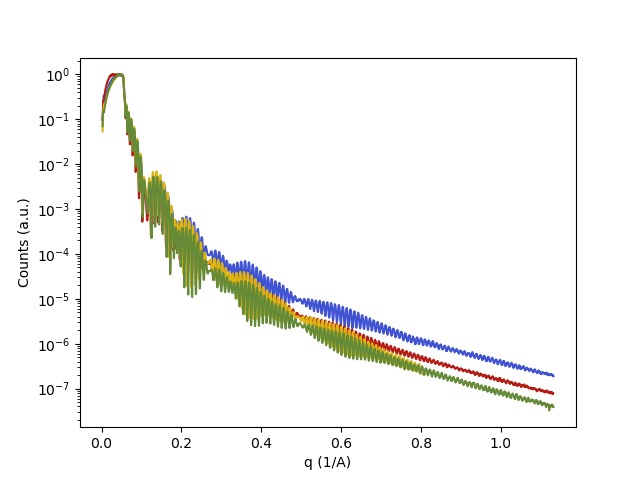

In [8]:

colors = ['#4053d3', '#b51d14', '#ddb310','#658b38','#7e1e9c', '#75bbfd', '#cacaca']
sns.set_palette(colors)

#truncate dataset in terms of x datapoints
#load and plot data
data = loadRefData(file, x_start, x_end) #this function loads to the data and converts the x-data from 2-theta to q
data2 = loadRefData(file2, x_start, x_end) #this function loads to the data and converts the x-data from 2-theta to q
data3 = loadRefData(file3, x_start, x_end) #this function loads to the data and converts the x-data from 2-theta to q
data4 = loadRefData(file4, x_start, x_end) #this function loads to the data and converts the x-data from 2-theta to q
plt.figure()

simplePlot(data.x, data.y, 'q (1/A)', 'Normalized Counts') #plot data
simplePlot(data2.x, data2.y, 'q (1/A)', 'Counts (a.u.)') #plot data
simplePlot(data3.x, data3.y, 'q (1/A)', 'Counts (a.u.)') #plot data
simplePlot(data4.x, data4.y, 'q (1/A)', 'Counts (a.u.)') #plot data

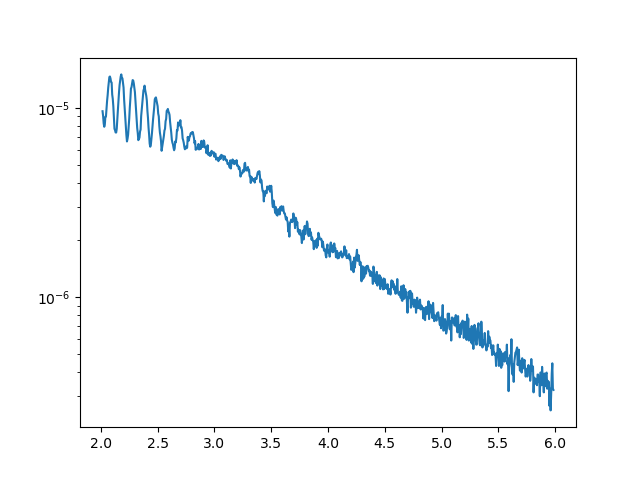

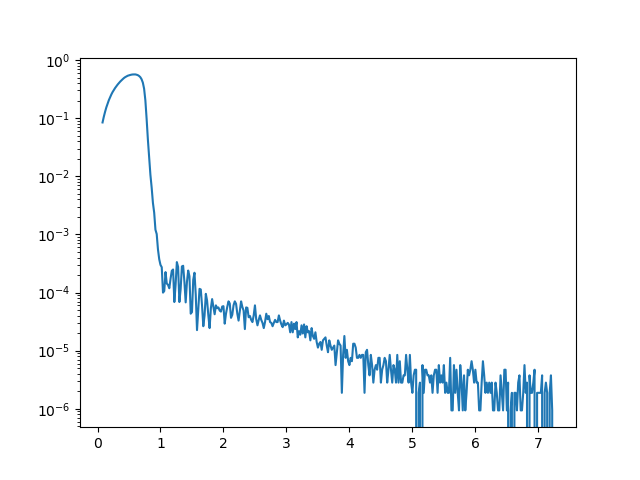

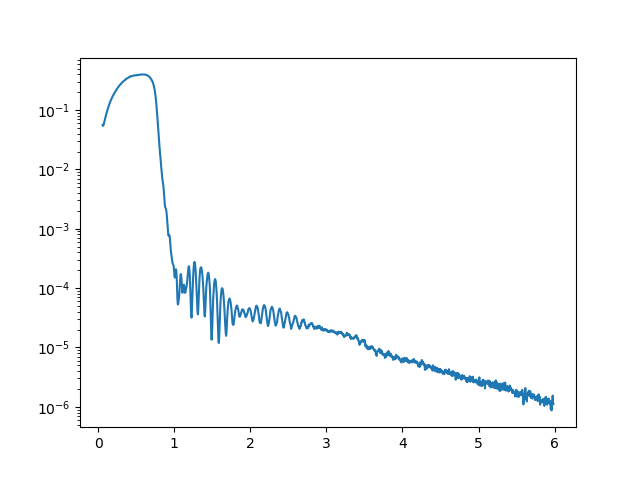

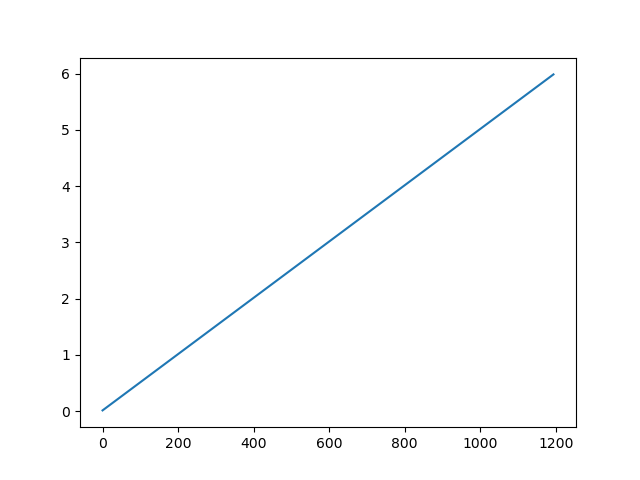

In [22]:
import pandas as pd
df=pd.read_csv(pth + 'NANK1_A_XRR_6deg.csv')

plt.figure()
plt.semilogy(df['2Theta'][400:], df['Normalized Counts'][400:])


df=pd.read_csv(pth + 'NANS2_B_XRR_8deg.csv')

plt.figure()
plt.semilogy(df['2Theta'][3:], df['Normalized Counts'][3:])


df=pd.read_csv(pth + 'NANK1_B_XRR_6deg.csv')

plt.figure()
plt.semilogy(df['2Theta'][8:], df['Normalized Counts'][8:])


(3e-08, 1.25)

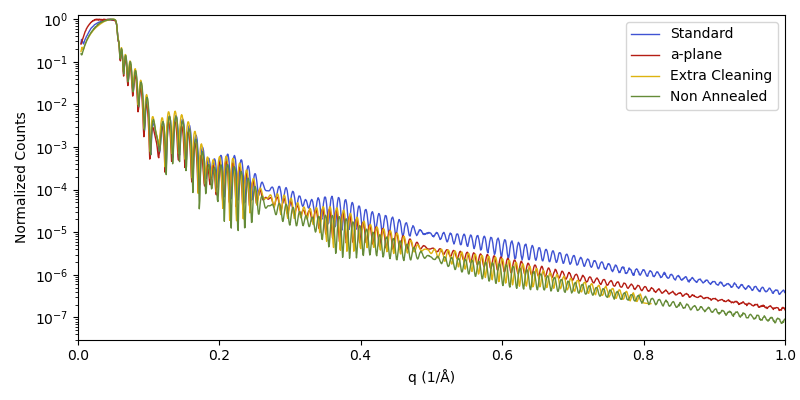

In [34]:

#x_start = 60
#x_end = 1500
def four_func(x, a, b): return a*x**-b 
x_start = 3
x_end=1500
fig, ax = plt.subplots(1,1, figsize=(8,4))
labels=['Standard','a-plane','Extra Cleaning','Non Annealed']
fname = ['su05_XRR_1_scan1.txt','su06_XRR_1_scan1.txt','su07_XRR_1_scan1.txt','su08_XRR_1_scan1.txt']#,'su01_XRR_3_scan1.txt','su02_XRR_1_scan1.txt','su03_XRR_1_scan1.txt','su04_XRR_1_scan1.txt']
#fname = ['su06_XRR_1_scan1.txt','su07_XRR_1_scan1.txt','su08_XRR_1_scan1.txt','su01_XRR_3_scan1.txt','su02_XRR_1_scan1.txt','su03_XRR_1_scan1.txt','su04_XRR_1_scan1.txt']

for i, f in enumerate(fname): 
    file = os.path.join(pth,f)
    data = loadRefData(file, x_start, x_end) #this function loads to the data and converts the x-data from 2-theta to q
    plt.semilogy(data.x, data.y,linewidth=1, label=labels[i])

    #simplePlot(data.x, data.y, 'q (1/A)', 'Counts (a.u.)') #plot data
xvals = np.linspace(0.03,1)
#plt.plot(xvals, four_func(xvals, 2e-7, 4))
ax.legend()
ax.set_xlabel('q (1/Å)')
ax.set_ylabel('Normalized Counts')
fig.tight_layout()
ax.set_xlim([0,1])
ax.set_ylim([3e-8,1.25e0])



In [123]:
import matplotlib

matplotlib.rcParams.update({'font.size': 11})

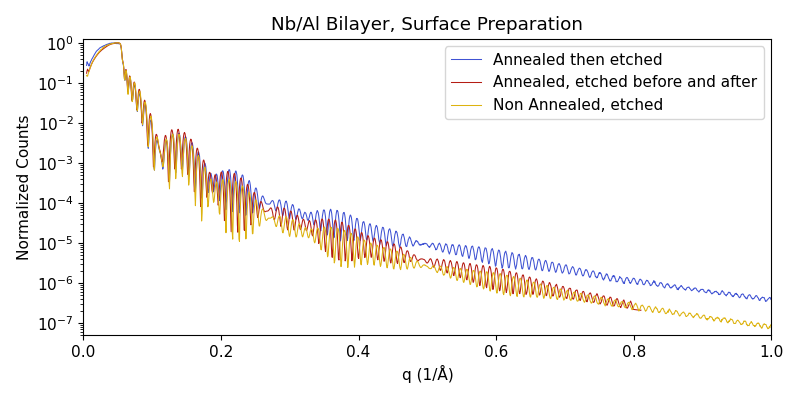

In [149]:

#x_start = 60
#x_end = 1500
def four_func(x, a, b): return a*x**-b 
x_start = 3
x_end=3000
fig, ax = plt.subplots(1,1, figsize=(8,4))
labels=['Annealed then etched','Annealed, etched before and after','Non Annealed, etched']
fname = ['su05_XRR_1_scan1.txt','su07_XRR_1_scan1.txt','su08_XRR_1_scan1.txt']#,'su01_XRR_3_scan1.txt','su02_XRR_1_scan1.txt','su03_XRR_1_scan1.txt','su04_XRR_1_scan1.txt']
#fname = ['su06_XRR_1_scan1.txt','su07_XRR_1_scan1.txt','su08_XRR_1_scan1.txt','su01_XRR_3_scan1.txt','su02_XRR_1_scan1.txt','su03_XRR_1_scan1.txt','su04_XRR_1_scan1.txt']

for i, f in enumerate(fname): 
    file = os.path.join(pth,f)
    data = loadRefData(file, x_start, x_end) #this function loads to the data and converts the x-data from 2-theta to q
    plt.semilogy(data.x, data.y,linewidth=0.75, label=labels[i])

    #simplePlot(data.x, data.y, 'q (1/A)', 'Counts (a.u.)') #plot data
xvals = np.linspace(0.03,1)
#plt.plot(xvals, four_func(xvals, 2e-7, 4))
ax.legend()
ax.set_xlabel('q (1/Å)')
ax.set_title('Nb/Al Bilayer, Surface Preparation')

ax.set_ylabel('Normalized Counts')
ax.set_xlim([0,1])
ax.set_ylim([5e-8,1.25e0])
fig.tight_layout()

fig.savefig(pth + 'single_layers', dpi=300)

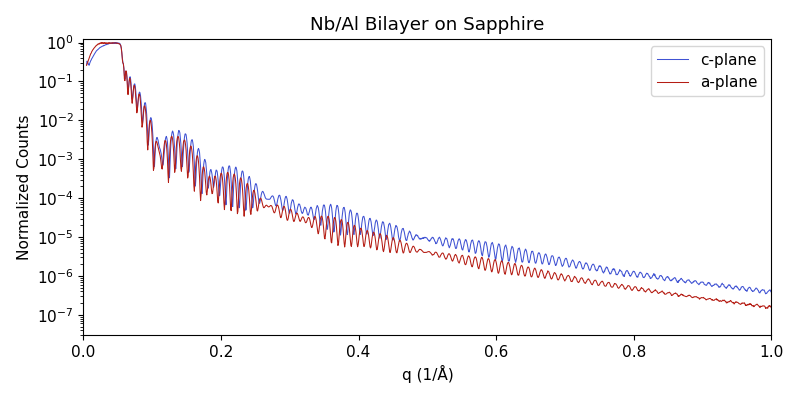

In [148]:

#x_start = 60
#x_end = 1500
def four_func(x, a, b): return a*x**-b 
x_start = 3
x_end=3000
fig, ax = plt.subplots(1,1, figsize=(8,4))
labels=['c-plane','a-plane']
fname = ['su05_XRR_1_scan1.txt','su06_XRR_1_scan1.txt']
#fname = ['su06_XRR_1_scan1.txt','su07_XRR_1_scan1.txt','su08_XRR_1_scan1.txt','su01_XRR_3_scan1.txt','su02_XRR_1_scan1.txt','su03_XRR_1_scan1.txt','su04_XRR_1_scan1.txt']

for i, f in enumerate(fname): 
    file = os.path.join(pth,f)
    data = loadRefData(file, x_start, x_end) #this function loads to the data and converts the x-data from 2-theta to q
    plt.semilogy(data.x, data.y,linewidth=0.75, label=labels[i])

    #simplePlot(data.x, data.y, 'q (1/A)', 'Counts (a.u.)') #plot data
xvals = np.linspace(0.03,1)
#plt.plot(xvals, four_func(xvals, 2e-7, 4))
ax.legend()
ax.set_xlabel('q (1/Å)')
ax.set_ylabel('Normalized Counts')
ax.set_xlim([0,1])
ax.set_ylim([3e-8,1.25e0])
ax.set_title('Nb/Al Bilayer on Sapphire')
fig.tight_layout()

fig.savefig(pth + 'compare_crystal', dpi=300)

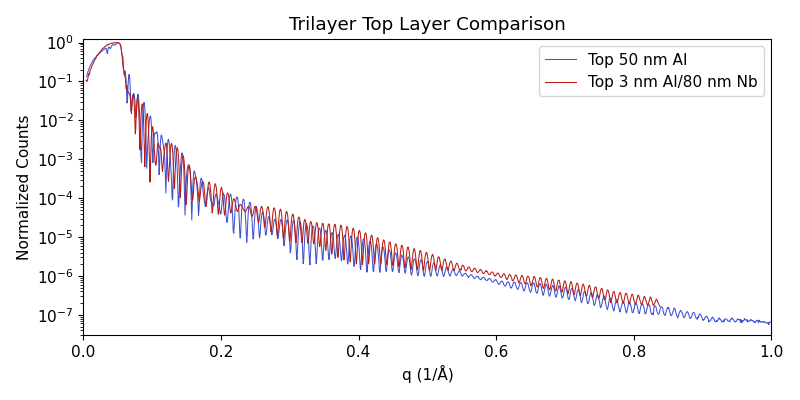

In [128]:

#x_start = 60
#x_end = 1500
def four_func(x, a, b): return a*x**-b 
x_start = 3
x_end=1500
fig, ax = plt.subplots(1,1, figsize=(8,4))
fname = ['su01_XRR_3_scan1.txt','su02_XRR_1_scan1.txt']#,'su03_XRR_1_scan1.txt','su04_XRR_1_scan1.txt']
labels = ['Top 50 nm Al', 'Top 3 nm Al/80 nm Nb']
for i, f in enumerate(fname): 
    file = os.path.join(pth,f)
    data = loadRefData(file, x_start, x_end) #this function loads to the data and converts the x-data from 2-theta to q
    plt.semilogy(data.x, data.y,linewidth=0.75, label=labels[i])

    #simplePlot(data.x, data.y, 'q (1/A)', 'Counts (a.u.)') #plot data
xvals = np.linspace(0.03,1)
#plt.plot(xvals, four_func(xvals, 2e-7, 4))
ax.legend()
ax.set_xlabel('q (1/Å)')
ax.set_ylabel('Normalized Counts')
ax.set_xlim([0,1])
ax.set_ylim([3e-8,1.25e0])
ax.set_title('Trilayer Top Layer Comparison')
fig.tight_layout()

fig.savefig(pth + 'top_layer', dpi=300)

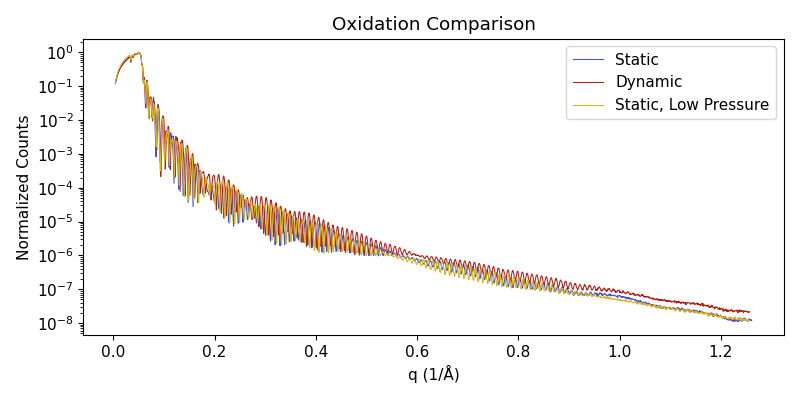

In [129]:

#x_start = 60
#x_end = 1800
def four_func(x, a, b): return a*x**-b 
x_start = 3
x_end=2000
fig, ax = plt.subplots(1,1, figsize=(8,4))
fname = ['su01_XRR_3_scan1.txt','su03_XRR_1_scan1.txt','su04_XRR_1_scan1.txt']
labels = ['Static', 'Dynamic', 'Static, Low Pressure']
for i, f in enumerate(fname): 
    file = os.path.join(pth,f)
    data = loadRefData(file, x_start, x_end) #this function loads to the data and converts the x-data from 2-theta to q
    plt.semilogy(data.x, data.y,linewidth=0.75, label=labels[i])

    #simplePlot(data.x, data.y, 'q (1/A)', 'Counts (a.u.)') #plot data
xvals = np.linspace(0.03,1)
#plt.plot(xvals, four_func(xvals, 2e-7, 4))
ax.legend()
ax.set_xlabel('q (1/Å)')
ax.set_ylabel('Normalized Counts')
#ax.set_xlim([0,1])
#ax.set_ylim([3e-8,1.25e0])
ax.set_title('Oxidation Comparison')
fig.tight_layout()

fig.savefig(pth + 'oxidation', dpi=300)

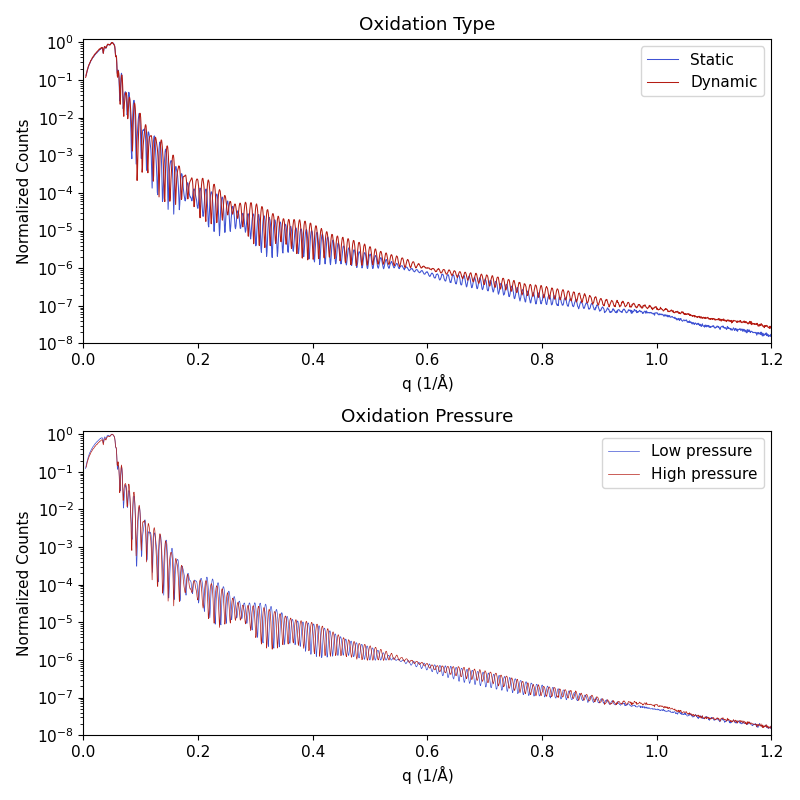

In [139]:
x_start = 3
x_end=2800
fig, ax = plt.subplots(2,1, figsize=(8,8))
fname = ['su01_XRR_3_scan1.txt','su03_XRR_1_scan1.txt']
labels = ['Static', 'Dynamic']
for i, f in enumerate(fname): 
    file = os.path.join(pth,f)
    data = loadRefData(file, x_start, x_end) #this function loads to the data and converts the x-data from 2-theta to q
    ax[0].semilogy(data.x, data.y,linewidth=0.75, label=labels[i])

    #simplePlot(data.x, data.y, 'q (1/A)', 'Counts (a.u.)') #plot data
xvals = np.linspace(0.03,1)
#plt.plot(xvals, four_func(xvals, 2e-7, 4))
ax[0].legend()
ax[0].set_xlabel('q (1/Å)')
ax[0].set_ylabel('Normalized Counts')
ax[0].set_xlim([0,1.2])
ax[0].set_ylim([1e-8,1.25e0])
ax[0].set_title('Oxidation Type')

x_start = 3
x_end=2000
#fname = ['su01_XRR_3_scan1.txt','su04_XRR_1_scan1.txt']
#labels = ['High pressure', 'Low pressure']

fname = ['su04_XRR_1_scan1.txt','su01_XRR_3_scan1.txt']
labels = ['Low pressure', 'High pressure']

for i, f in enumerate(fname): 
    file = os.path.join(pth,f)
    data = loadRefData(file, x_start, x_end) #this function loads to the data and converts the x-data from 2-theta to q
    ax[1].semilogy(data.x, data.y,linewidth=0.5, label=labels[i])

    #simplePlot(data.x, data.y, 'q (1/A)', 'Counts (a.u.)') #plot data
xvals = np.linspace(0.03,1)
#plt.plot(xvals, four_func(xvals, 2e-7, 4))
ax[1].legend()
ax[1].set_xlabel('q (1/Å)')
ax[1].set_ylabel('Normalized Counts')
ax[1].set_xlim([0,1.2])
ax[1].set_ylim([1e-8,1.25e0])
ax[1].set_title('Oxidation Pressure')
fig.tight_layout()

fig.savefig(pth + 'trilayer', dpi=300)

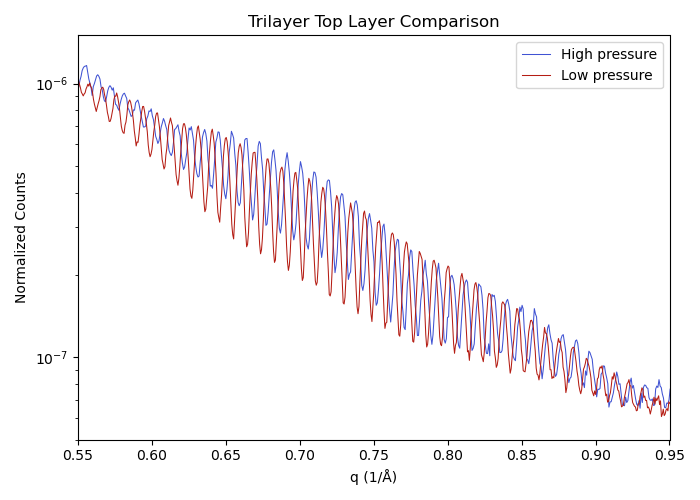

In [99]:
x_start = 3
x_end=2000
fig, ax = plt.subplots(1,1, figsize=(7,5))
fname = ['su01_XRR_3_scan1.txt','su04_XRR_1_scan1.txt']
labels = ['High pressure', 'Low pressure']
for i, f in enumerate(fname): 
    file = os.path.join(pth,f)
    data = loadRefData(file, x_start, x_end) #this function loads to the data and converts the x-data from 2-theta to q
    plt.semilogy(data.x, data.y,linewidth=0.75, label=labels[i])

    #simplePlot(data.x, data.y, 'q (1/A)', 'Counts (a.u.)') #plot data
xvals = np.linspace(0.03,1)
#plt.plot(xvals, four_func(xvals, 2e-7, 4))
ax.legend()
ax.set_xlabel('q (1/Å)')
ax.set_ylabel('Normalized Counts')
ax.set_xlim([0.55,0.95])
ax.set_ylim([5e-8,1.5e-6])
ax.set_title('Trilayer Top Layer Comparison')
fig.tight_layout()

fig.savefig(pth + 'top_layer', dpi=300)

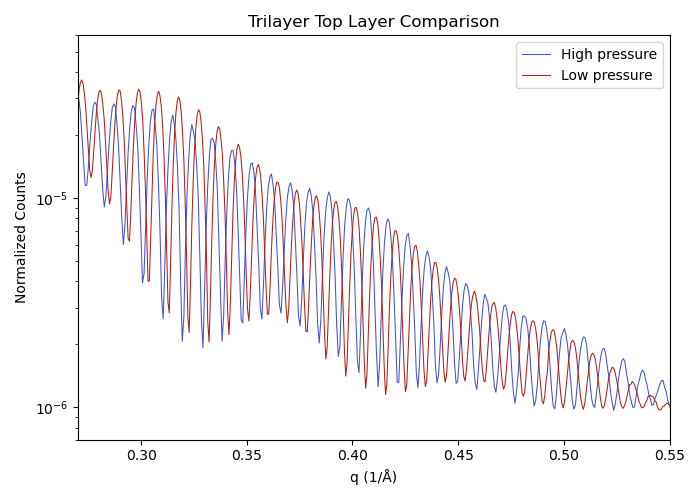

In [106]:
x_start = 3
x_end=2000
fig, ax = plt.subplots(1,1, figsize=(7,5))
fname = ['su01_XRR_3_scan1.txt','su04_XRR_1_scan1.txt']
labels = ['High pressure', 'Low pressure']
for i, f in enumerate(fname): 
    file = os.path.join(pth,f)
    data = loadRefData(file, x_start, x_end) #this function loads to the data and converts the x-data from 2-theta to q
    plt.semilogy(data.x, data.y,linewidth=0.75, label=labels[i])

    #simplePlot(data.x, data.y, 'q (1/A)', 'Counts (a.u.)') #plot data
xvals = np.linspace(0.03,1)
#plt.plot(xvals, four_func(xvals, 2e-7, 4))
ax.legend()
ax.set_xlabel('q (1/Å)')
ax.set_ylabel('Normalized Counts')
ax.set_xlim([0.27,0.55])
ax.set_ylim([7e-7,6e-5])
ax.set_title('Trilayer Top Layer Comparison')
fig.tight_layout()

fig.savefig(pth + 'top_layer', dpi=300)

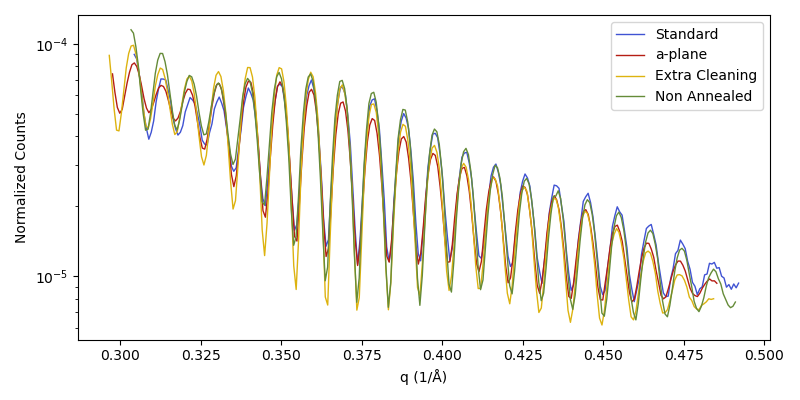

In [48]:
#x_start = 60
#x_end = 1500
def four_func(x, a, b): return a*x**-b 
x_start = 400
x_end=650
fig, ax = plt.subplots(1,1, figsize=(8,4))
labels=['Standard','a-plane','Extra Cleaning','Non Annealed']
fname = ['su05_XRR_1_scan1.txt','su06_XRR_1_scan1.txt','su07_XRR_1_scan1.txt','su08_XRR_1_scan1.txt']#,'su01_XRR_3_scan1.txt','su02_XRR_1_scan1.txt','su03_XRR_1_scan1.txt','su04_XRR_1_scan1.txt']
#fname = ['su06_XRR_1_scan1.txt','su07_XRR_1_scan1.txt','su08_XRR_1_scan1.txt','su01_XRR_3_scan1.txt','su02_XRR_1_scan1.txt','su03_XRR_1_scan1.txt','su04_XRR_1_scan1.txt']
scale = [1, 2, 2, 3]
#scale = [1, 1, 1, 1]
xoff = [0, 0.006, 0.007, 0.001]
for i, f in enumerate(fname): 
    file = os.path.join(pth,f)
    data = loadRefData(file, x_start, x_end) #this function loads to the data and converts the x-data from 2-theta to q
    plt.semilogy(data.x-xoff[i], scale[i]*data.y,linewidth=1, label=labels[i])

    #simplePlot(data.x, data.y, 'q (1/A)', 'Counts (a.u.)') #plot data
xvals = np.linspace(0.03,1)
#plt.plot(xvals, four_func(xvals, 2e-7, 4))
ax.legend()
ax.set_xlabel('q (1/Å)')
ax.set_ylabel('Normalized Counts')
fig.tight_layout()
# ax.set_xlim([0,1])
# ax.set_ylim([3e-8,1.25e0])

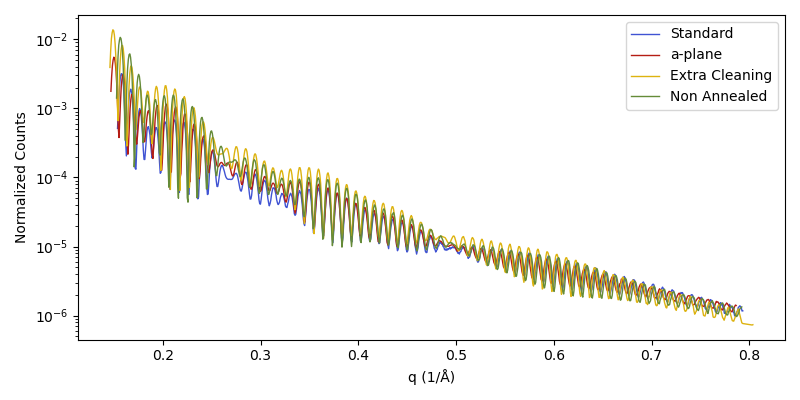

In [53]:
#x_start = 60
#x_end = 1500
def four_func(x, a, b): return a*x**-b 
x_start = 200
x_end=1050
fig, ax = plt.subplots(1,1, figsize=(8,4))
labels=['Standard','a-plane','Extra Cleaning','Non Annealed']
fname = ['su05_XRR_1_scan1.txt','su06_XRR_1_scan1.txt','su07_XRR_1_scan1.txt','su08_XRR_1_scan1.txt']#,'su01_XRR_3_scan1.txt','su02_XRR_1_scan1.txt','su03_XRR_1_scan1.txt','su04_XRR_1_scan1.txt']
#fname = ['su06_XRR_1_scan1.txt','su07_XRR_1_scan1.txt','su08_XRR_1_scan1.txt','su01_XRR_3_scan1.txt','su02_XRR_1_scan1.txt','su03_XRR_1_scan1.txt','su04_XRR_1_scan1.txt']
scale = [1, 2.5, 3.5, 4]
#scale = [1, 1, 1, 1]
xoff = [0, 0.006, 0.007, 0.001]
for i, f in enumerate(fname): 
    file = os.path.join(pth,f)
    data = loadRefData(file, x_start, x_end) #this function loads to the data and converts the x-data from 2-theta to q
    plt.semilogy(data.x-xoff[i], scale[i]*data.y,linewidth=1, label=labels[i])

    #simplePlot(data.x, data.y, 'q (1/A)', 'Counts (a.u.)') #plot data
xvals = np.linspace(0.03,1)
#plt.plot(xvals, four_func(xvals, 2e-7, 4))
ax.legend()
ax.set_xlabel('q (1/Å)')
ax.set_ylabel('Normalized Counts')
fig.tight_layout()
# ax.set_xlim([0,1])
# ax.set_ylim([3e-8,1.25e0])

Model will fit:
d_min: 0.03993566549561132 A
d_max: 0.8631468026100191 A

Model will fit:
d_min: 0.03993566549561132 A
d_max: 1.1309411155316211 A



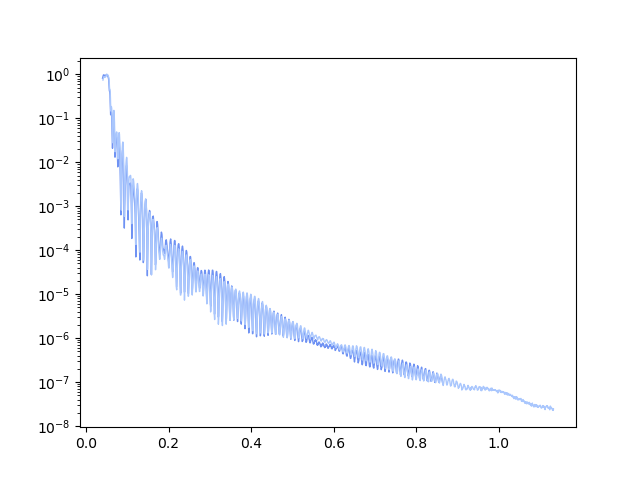

In [352]:

x_start = 50
x_end=1500
fname = ['su01_XRR_1_scan1.txt','su01_XRR_3_scan1.txt']

sns.set_palette('coolwarm',5)
plt.figure()
i=0
for f in fname: 
    file = os.path.join(pth,f)
    data = loadRefData(file, x_start, x_end) #this function loads to the data and converts the x-data from 2-theta to q
    plt.semilogy(data.x+0.001*i, data.y,linewidth=1)
    i+=1

Model will fit:
d_min: 0.03993566549561132 A
d_max: 0.8631468026100191 A

Model will fit:
d_min: 0.03328078196235966 A
d_max: 0.8379353310687191 A



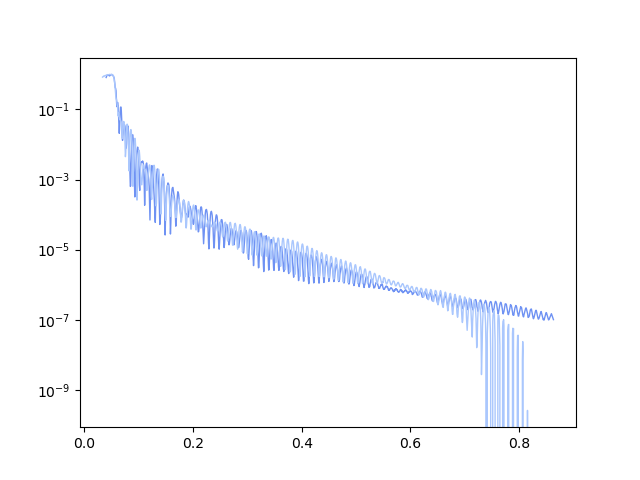

In [359]:

x_start = 50
x_end=1500
fname = ['su01_XRR_1_scan1.txt','su02_XRR_1_scan1.txt']

sns.set_palette('coolwarm',5)
plt.figure()
i=0
for f in fname: 
    file = os.path.join(pth,f)
    data = loadRefData(file, x_start, x_end) #this function loads to the data and converts the x-data from 2-theta to q
    plt.semilogy(data.x, data.y-3e-7*i,linewidth=1)
    i+=1

## Some functions

In [10]:
print(
    f"refnx: {refnx.version.version}\n"
    f"scipy: {scipy.version.version}\n"
    f"numpy: {np.version.version}\n"
)

def save_fig(fig, path, name):
    timestr = time.strftime("%Y%m%d-%H%M%S")
    path_out = os.path.splitext(path)[0] + "_" + name + "_" + timestr+ ".png"
    fig.savefig(path_out)
    return str(path_out)

def save_text(string, path, name):
    timestr = time.strftime("%Y%m%d-%H%M%S")
    path_out = os.path.splitext(path)[0] + "_" + name + "_" + timestr + ".txt"
    text_file = open(path_out, "w")
    text_file.write(string)
    text_file.close()
    return str(path_out)

def loadRefData(path,x_start, x_end):
    data = np.loadtxt(path) #load text
    x = data[x_start:x_end,0].T
    y = data[x_start:x_end,1].T/max(data[:,1])
    #conv t-th to q using 0.72769 A wavelength
    x_new = refnx.util.q(x/2, 0.72769) 
    compiled = (x_new,y)
    #returns the ReflectDataset object
    #print (f"Model will fit:\nd_min: {min(x_new)} A\n"
    #   f"d_max: {max(x_new)} A\n")

    return ReflectDataset(compiled)

def simplePlot(x,y,s1,s2):
    #plt.loglog(x, y)
    plt.semilogy(x, y)
    plt.xlabel(s1)
    plt.ylabel(s2)

def plotOut(x,y,s1,s2):
    fig, ax = plt.subplots()
    ax.plot(x,y)
    ax.set(xlabel=s1, ylabel=s2)
    plt.show()
    return fig, ax

refnx: 0.1.47
scipy: 1.11.4
numpy: 1.26.4



## Generate a Dictionary of Material SLDs

In [3]:
#Define dictionary of materials and corresponding SLDs. You may want to add Nb, for example
SLD_val_dict = {'Al2O3':8.419,
                'Nb2O5':7.794,
                'Nb':64.035,
               'Al' : 22.191,
               'Ta' : 112.931,
               'air': 0,
               'native': 28}
#       'Al2O3': 33.385,

#RefNX has SLD objects. I am going to make a dictionary of SLD objects named by the SLD_val_dict labels.
SLD_dict = dict()
for material in SLD_val_dict:
   SLD_dict[material] = SLD(SLD_val_dict[material], name = material)

print ("SLD_val_dict: ", SLD_val_dict, " 1e-6 A^-2")
## Load and clip data
#set the path to your file here. my files have no headers.
#path = r'C:\Users\abelson2\Documents\Quantum Computing Group\XRR\New folder\lv2.txt'


#Define slab parameters. Each row here is a new "slab", which is defined by an SLD, thickness, and roughness.
air = SLD_dict['air'](np.inf,0) #returns a slab with SLD = 0 (for air), infinite thickness, zero roughness.
top_oxide = SLD_dict['native'](8, 1) # this is al2o3 but hermal? 
top_al = SLD_dict['Al'](208,3)
JJ = SLD(15, name = 'JJ')(4, 2) #in this case I am just specifying an SLD rather than using a dictionary value.
JJ_buffer = SLD(15, name = 'JJ_buffer')(4, 2)
bottom_al = SLD_dict['Al'](282,2)

al = SLD_dict['Al'](80,2)
nb = SLD_dict['Nb'](800,1)
substrate = SLD_dict['Al2O3'](np.inf,12.4) # this is crystalline? 
structure =  air | al | nb | substrate  
model = ReflectModel(structure, bkg=3e-8, dq=0.05, scale = 1)

plt.figure()
q = np.linspace(0.05, 0.2, 1001)
simplePlot(data.x, data.y, 'q (1/A)', 'Counts (a.u.)') #plot data

plt.semilogy(q, model(q))

SLD_val_dict:  {'Al2O3': 8.419, 'Nb2O5': 7.794, 'Nb': 64.035, 'Al': 22.191, 'Ta': 112.931, 'air': 0, 'native': 28}  1e-6 A^-2


NameError: name 'simplePlot' is not defined

<Figure size 640x480 with 0 Axes>

In [360]:
import ana_xrr
xrng = [50,200]
obj = ana_xrr.run_simulation(file, xrng=xrng, level=5,run_mc=True, plot=True, cfg_vary_in={'substrate_sld':True}, SLD_rng=1)


Model will fit:
d_min: 0.03328078196235966 A
d_max: 0.12683676128971663 A

________________________________________________________________________________
Objective - 16874505360
Dataset = <None>, 150 points
datapoints = 150
chi2 = 93.33432168213056
Weighted = False
Transform = Transform('logY')
________________________________________________________________________________
Parameters:       ''       
________________________________________________________________________________
Parameters: 'instrument parameters'
<Parameter:    'scale'    , value=1          , bounds=[0.9, 1.5]>
<Parameter:     'bkg'     , value=3e-08          , bounds=[1e-09, 5e-06]>
<Parameter:'dq - resolution', value=0.05  (fixed) , bounds=[0.001, 0.1]>
<Parameter:  'q_offset'   , value=0          , bounds=[-0.1, 0.1]>
________________________________________________________________________________
Parameters: 'Structure - ' 
________________________________________________________________________________
Parame

2.4871683023718654: : 471it [00:53,  8.75it/s]
/opt/anaconda3/lib/python3.11/site-packages/refnx/analysis/curvefitter.py:392: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  init_walkers = rng.multivariate_normal(


________________________________________________________________________________
Objective - 16874505360
Dataset = <None>, 150 points
datapoints = 150
chi2 = 4.964522928525932
Weighted = False
Transform = Transform('logY')
________________________________________________________________________________
Parameters:       ''       
________________________________________________________________________________
Parameters: 'instrument parameters'
<Parameter:    'scale'    , value=1.00965 +/- 0.078, bounds=[0.9, 1.5]>
<Parameter:     'bkg'     , value=5e-06 +/- 0.00133, bounds=[1e-09, 5e-06]>
<Parameter:'dq - resolution', value=0.05  (fixed) , bounds=[0.001, 0.1]>
<Parameter:  'q_offset'   , value=0.00169436 +/- 0.0507, bounds=[-0.1, 0.1]>
________________________________________________________________________________
Parameters: 'Structure - ' 
________________________________________________________________________________
Parameters:      'air'     
<Parameter: 'air - thick' , value=i

  7%|▋         | 334/5000 [00:24<05:41, 13.67it/s]Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.11/site-packages/refnx/_lib/emcee/ensemble.py", line 624, in __call__
    return self.f(x, *self.args, **self.kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.11/site-packages/refnx/analysis/objective.py", line 740, in logpost
    logpost += self.logl()
               ^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.11/site-packages/refnx/analysis/objective.py", line 681, in logl
    extra_potential = self.model.logp()
                      ^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.11/site-packages/refnx/reflect/reflect_model.py", line 557, in logp
    return self.structure.logp()
           ^^^^^^^^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.11/site-packages/refnx/reflect/structure.py", line 656, in logp
    logp += component.logp()
    ^^^^
KeyboardInterrupt
  7%|▋         | 335/5000 [00:25<05:51, 13.28it/s]

emcee: Exception while calling your likelihood function:
  params: [ 9.98339867e-01  2.48173351e-06 -1.23499686e-02  9.14514613e+00
  6.32131756e+00  1.44295132e+01  6.27489350e+01  2.67911877e+01
  4.53854621e+00  3.29721181e+00  6.83965774e+00  1.42507882e+01
  7.91588418e+02  2.73079575e+01  3.28870860e+00  5.52383403e+00
  1.38520924e+01  5.47399646e+01  6.40469893e+00  1.25581234e+01]
  args: []
  kwargs: {}
  exception:


KeyboardInterrupt: 

Model will fit:
d_min: 0.08589859025305041 A
d_max: 0.6049337575554813 A

________________________________________________________________________________
Objective - 17075259472
Dataset = <None>, 690 points
datapoints = 690
chi2 = 3915.92783038054
Weighted = False
Transform = Transform('logY')
________________________________________________________________________________
Parameters:       ''       
________________________________________________________________________________
Parameters: 'instrument parameters'
<Parameter:    'scale'    , value=1          , bounds=[0.9, 1.5]>
<Parameter:     'bkg'     , value=3e-08          , bounds=[1e-09, 5e-06]>
<Parameter:'dq - resolution', value=0.05  (fixed) , bounds=[0.001, 0.1]>
<Parameter:  'q_offset'   , value=0          , bounds=[-0.1, 0.1]>
________________________________________________________________________________
Parameters: 'Structure - ' 
________________________________________________________________________________
Paramete

130.54024602829622: : 202it [00:25,  8.00it/s]
/opt/anaconda3/lib/python3.11/site-packages/refnx/util/ErrorProp.py:87: RuntimeWarning: invalid value encountered in log10
  return n * np.log10(k * a), np.absolute(n * da / (a * np.log(10)))
/opt/anaconda3/lib/python3.11/site-packages/refnx/analysis/objective.py:1441: RuntimeWarning: Some of the transformed data was non-finite. Please check your datasets for points with zero or negative values.
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/refnx/analysis/curvefitter.py:826: RuntimeWarning: invalid value encountered in sqrt
  errors = np.sqrt(np.diag(covar))


________________________________________________________________________________
Objective - 17075259472
Dataset = <None>, 690 points
datapoints = 690
chi2 = 257.3278578730842
Weighted = False
Transform = Transform('logY')
________________________________________________________________________________
Parameters:       ''       
________________________________________________________________________________
Parameters: 'instrument parameters'
<Parameter:    'scale'    , value=1.5 +/- 0.171, bounds=[0.9, 1.5]>
<Parameter:     'bkg'     , value=5e-06 +/- 5.31e-07, bounds=[1e-09, 5e-06]>
<Parameter:'dq - resolution', value=0.05  (fixed) , bounds=[0.001, 0.1]>
<Parameter:  'q_offset'   , value=-0.0670024  +/- nan , bounds=[-0.1, 0.1]>
________________________________________________________________________________
Parameters: 'Structure - ' 
________________________________________________________________________________
Parameters:      'air'     
<Parameter: 'air - thick' , value=inf  

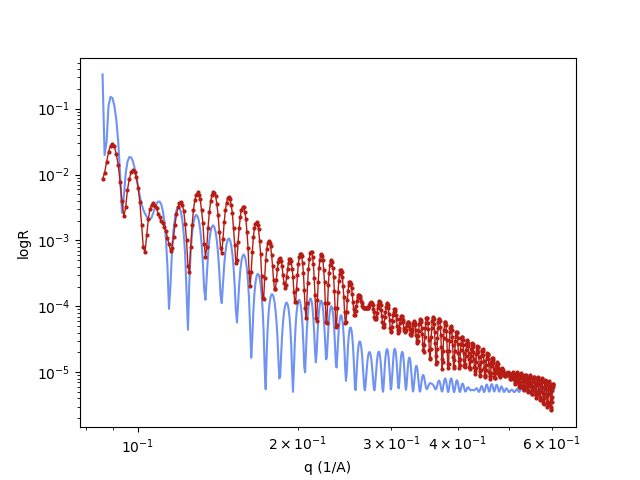

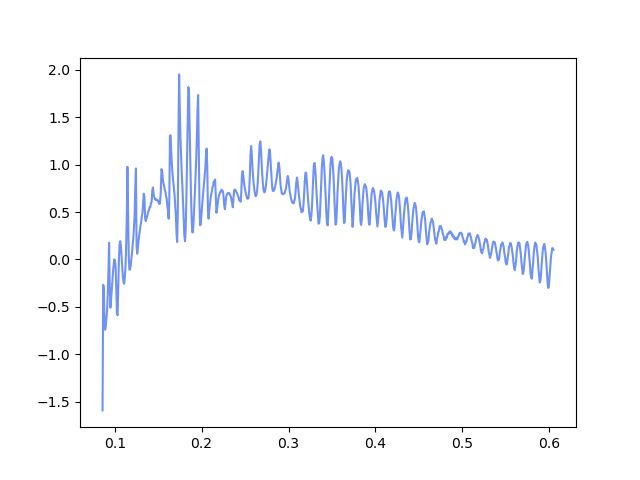

In [375]:

fname = 'su05_XRR_1_scan1.txt'
file = os.path.join(pth,fname)

xrng = [110,800]
obj, model = ana_xrr.run_simulation(file, xrng=xrng, level=5,run_mc=False, plot=True, SLD_rng=0.5)




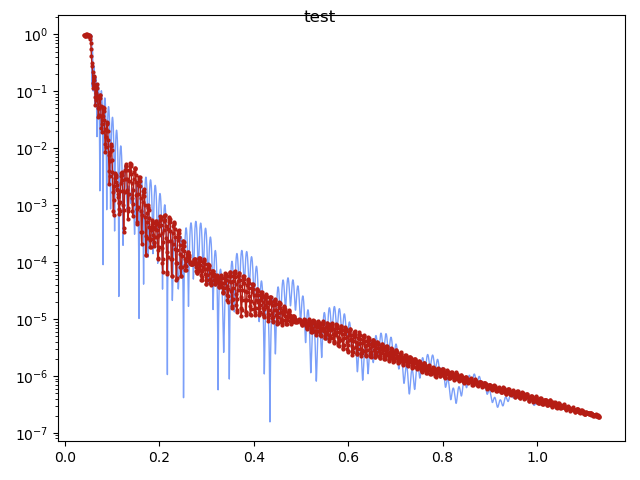

In [292]:
ana_xrr.plot_model({'bottom_oxide_rough':2.5,'bkg':1.5e-7,'al_sld':55},data,'test')

In [ ]:
obj2 = ana_xrr.run_simulation(file, xrng=xrng, level=5,run_mc=False, SLD_rng=0.4, plot=False)
#obj2 = ana_xrr.run_simulation(file, xrng=[50, 150], level=3,run_mc=False, cfg_vary_in={'dq':False})
#obj2 = ana_xrr.run_simulation(file, xrng=[50, 150], level=3,run_mc=True)

data = loadRefData(file, xrng[0], xrng[1]) #this function loads to the data and converts the x-data from 2-theta to q
sns.set_palette('coolwarm',8)
fig1 = plt.figure() 

plt.semilogy(data.x, obj.model(data.x), label='First')
plt.semilogy(data.x, obj2.model(data.x), label='second')
plt.legend()
#plt.semilogy(data.x, obj3.model(data.x))
plt.semilogy(data.x, data.y, '.-', color='#b51d14', linewidth=1, markersize=4, alpha=0.5)
plt.xlabel("q (1/A)")
plt.ylabel("logR")
plt.xscale('log')

Model will fit:
d_min: 0.051991555127795804 A
d_max: 0.2659739225250572 A

________________________________________________________________________________
Objective - 13093131344
Dataset = <None>, 285 points
datapoints = 285
chi2 = 104.20840530579395
Weighted = False
Transform = Transform('logY')
________________________________________________________________________________
Parameters:       ''       
________________________________________________________________________________
Parameters: 'instrument parameters'
<Parameter:    'scale'    , value=1          , bounds=[0.9, 1.5]>
<Parameter:     'bkg'     , value=3e-08          , bounds=[1e-09, 5e-06]>
<Parameter:'dq - resolution', value=0.05  (fixed) , bounds=[0.001, 0.1]>
<Parameter:  'q_offset'   , value=0          , bounds=[-0.1, 0.1]>
________________________________________________________________________________
Parameters: 'Structure - ' 
________________________________________________________________________________
Param

9.217690015828044: : 214it [00:23,  9.12it/s]


________________________________________________________________________________
Objective - 13093131344
Dataset = <None>, 285 points
datapoints = 285
chi2 = 18.392128716607914
Weighted = False
Transform = Transform('logY')
________________________________________________________________________________
Parameters:       ''       
________________________________________________________________________________
Parameters: 'instrument parameters'
<Parameter:    'scale'    , value=0.952699 +/- 0.194, bounds=[0.9, 1.5]>
<Parameter:     'bkg'     , value=5e-06 +/- 0.000994, bounds=[1e-09, 5e-06]>
<Parameter:'dq - resolution', value=0.05  (fixed) , bounds=[0.001, 0.1]>
<Parameter:  'q_offset'   , value=0.00356149 +/- 0.0085, bounds=[-0.1, 0.1]>
________________________________________________________________________________
Parameters: 'Structure - ' 
________________________________________________________________________________
Parameters:      'air'     
<Parameter: 'air - thick' , valu

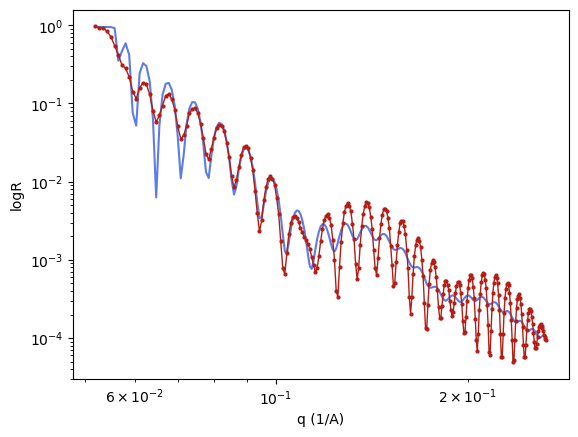

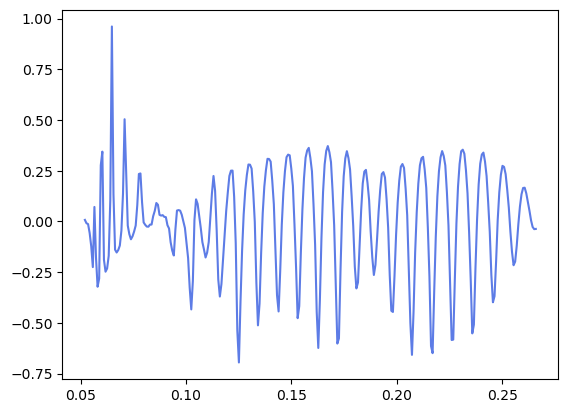

In [137]:
obj, mod = ana_xrr.run_simulation(file, xrng=xrng, level=5,run_mc=False, plot=True, cfg_vary_in={'substrate_sld':True})

Model will fit:
d_min: 0.051991555127795804 A
d_max: 0.2659739225250572 A

________________________________________________________________________________
Objective - 13034309584
Dataset = <None>, 285 points
datapoints = 285
chi2 = 104.20840530579395
Weighted = False
Transform = Transform('logY')
________________________________________________________________________________
Parameters:       ''       
________________________________________________________________________________
Parameters: 'instrument parameters'
<Parameter:    'scale'    , value=1          , bounds=[0.9, 1.5]>
<Parameter:     'bkg'     , value=3e-08          , bounds=[1e-09, 5e-06]>
<Parameter:'dq - resolution', value=0.05  (fixed) , bounds=[0.001, 0.1]>
<Parameter:  'q_offset'   , value=0          , bounds=[-0.1, 0.1]>
________________________________________________________________________________
Parameters: 'Structure - ' 
________________________________________________________________________________
Param

9.404032006403845: : 222it [00:23,  9.59it/s] 


________________________________________________________________________________
Objective - 13034309584
Dataset = <None>, 285 points
datapoints = 285
chi2 = 18.762251291457808
Weighted = False
Transform = Transform('logY')
________________________________________________________________________________
Parameters:       ''       
________________________________________________________________________________
Parameters: 'instrument parameters'
<Parameter:    'scale'    , value=1.04575 +/- 0.189, bounds=[0.9, 1.5]>
<Parameter:     'bkg'     , value=5e-06 +/- 0.000328, bounds=[1e-09, 5e-06]>
<Parameter:'dq - resolution', value=0.05  (fixed) , bounds=[0.001, 0.1]>
<Parameter:  'q_offset'   , value=0.000350094 +/- 0.00405, bounds=[-0.1, 0.1]>
________________________________________________________________________________
Parameters: 'Structure - ' 
________________________________________________________________________________
Parameters:      'air'     
<Parameter: 'air - thick' , val

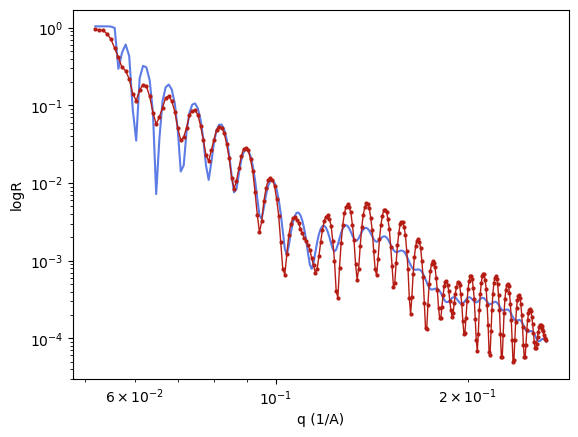

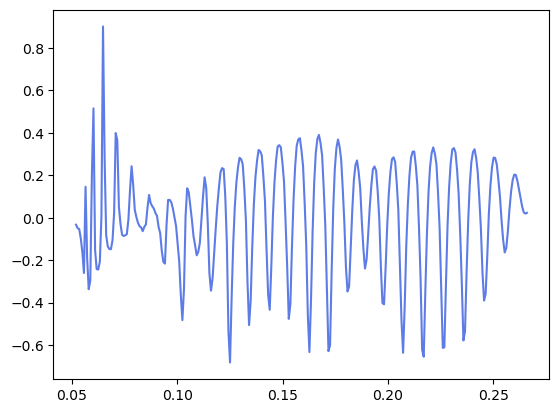

In [163]:
import ana_xrr
obj, model = ana_xrr.run_simulation(file, xrng=xrng, level=5,run_mc=False, plot=True, fit=True, objective=obj)

<Parameter:'native - rough', value=2.91034  +/- 327 , bounds=[0.0, 25.0]>
<Parameter: 'Al - rough'  , value=3.44357  +/- 206 , bounds=[0.0, 20.0]>
<Parameter:'Nb2O5_mid - rough', value=12.9563 +/- 60.8 , bounds=[0.0, 75.0]>
<Parameter: 'Nb - rough'  , value=0.378775 +/- 98.4 , bounds=[0.0, 10.0]>
<Parameter:'Nb2O5_bot - rough', value=10 +/- 1.41 , bounds=[0.0, 75.0]>
<Parameter:'Al2O3 - rough', value=0.643299  +/- 142 , bounds=[0.0, 20.0]>
<Parameter:  'Al - sld'   , value=10 +/- 10.4 , bounds=[17.94, 26.91]>
Model will fit:
d_min: 0.051991555127795804 A
d_max: 0.3789783817209021 A

________________________________________________________________________________
Objective - 13049792656
Dataset = <None>, 435 points
datapoints = 435
chi2 = 153.31405926863687
Weighted = False
Transform = Transform('logY')
________________________________________________________________________________
Parameters:       ''       
_____________________________________________________________________________

11.920652141234918: : 217it [00:22,  9.47it/s]


________________________________________________________________________________
Objective - 13049792656
Dataset = <None>, 435 points
datapoints = 435
chi2 = 23.82164001466907
Weighted = False
Transform = Transform('logY')
________________________________________________________________________________
Parameters:       ''       
________________________________________________________________________________
Parameters: 'instrument parameters'
<Parameter:    'scale'    , value=1.4671 +/- 0.291, bounds=[0.9, 1.5]>
<Parameter:     'bkg'     , value=3.77605e-06 +/- 0.000181, bounds=[1e-09, 5e-06]>
<Parameter:'dq - resolution', value=0.05  (fixed) , bounds=[0.001, 0.1]>
<Parameter:  'q_offset'   , value=0.00548461 +/- 0.0078, bounds=[-0.1, 0.1]>
________________________________________________________________________________
Parameters: 'Structure - ' 
________________________________________________________________________________
Parameters:      'air'     
<Parameter: 'air - thick' , v

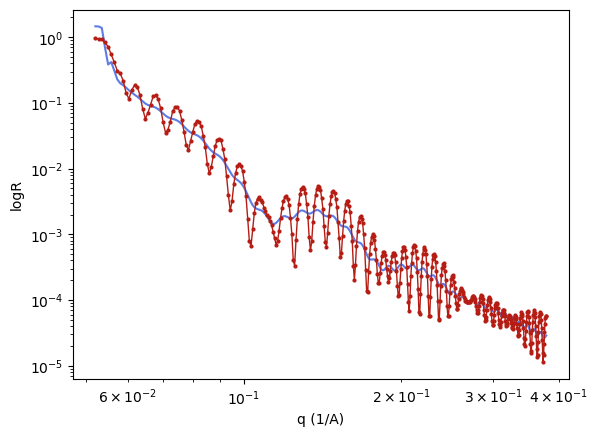

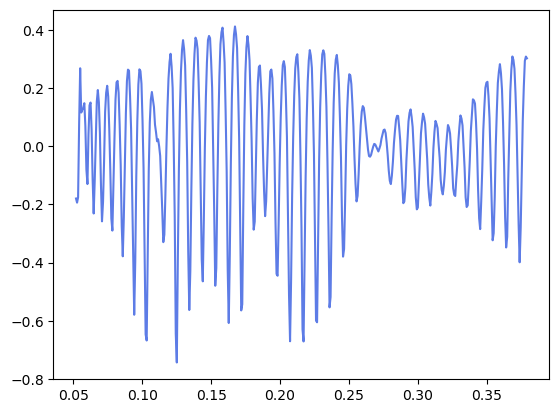

In [218]:
# first index ; first the beam line, then the different slabs 
# for 1, each index is a layer 
# then, first is the thickness, 22nd has the other parameters 
# sld , roughness 
# [1][n] 
# 0 thickness 
# 1 / 0 sld 
# 2 roughness 
print(obj.parameters[1][1][2])
print(obj.parameters[1][2][2])
print(obj.parameters[1][3][2])
print(obj.parameters[1][4][2])
print(obj.parameters[1][5][2])
print(obj.parameters[1][6][2])
#obj.parameters[1][1][2].value=4
#obj.parameters[1][3][2].value=4
obj.parameters[1][5][2].value=10

print(obj.parameters[1][2][1][0])
obj.parameters[1][2][1][0].value=10
#obj.parameters[1][6][1][0].value=8.4
xrng = [65,500]

obj2, model = ana_xrr.run_simulation(file, xrng=xrng, level=5,run_mc=False, plot=True, fit=True)
#print(obj2)


In [216]:
xrng

[65, 350]

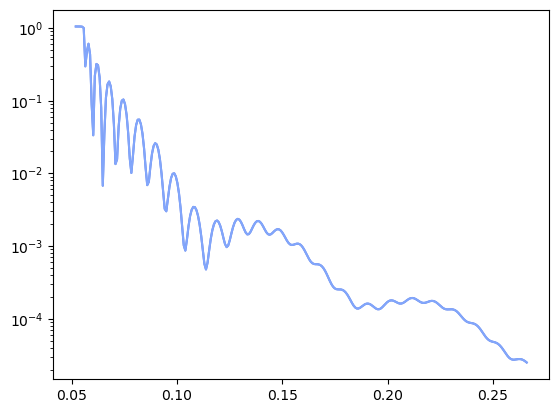

In [192]:

plt.figure()
#plt.semilogy(obj2.data.x,obj2.data.y)
plt.semilogy(obj2.data.x, obj2.model(obj2.data.x))
plt.semilogy(obj.data.x, obj.model(obj.data.x))

In [125]:
obj, model = ana_xrr.run_simulation(file, xrng=xrng, level=5,run_mc=False, plot=True, fit=True)

FileNotFoundError: /var/folders/00/4dhzg6ms0xl3w8qywb_l4_nw0000gn/T/ipykernel_59581/1893478763.py not found.

In [126]:
file

'/var/folders/00/4dhzg6ms0xl3w8qywb_l4_nw0000gn/T/ipykernel_59581/1893478763.py'

In [106]:
print(mod)

ReflectModel(Structure(components=[Slab(Parameter(value=inf, name='air - thick', vary=False, bounds=Interval(lb=-np.inf, ub=np.inf), constraint=None), SLD([Parameter(value=0.0, name='air - sld', vary=False, bounds=Interval(lb=0.0, ub=0.0), constraint=None), Parameter(value=0.0, name='air - isld', vary=False, bounds=Interval(lb=-np.inf, ub=np.inf), constraint=None)], name='air'), Parameter(value=0.0, name='air - rough', vary=False, bounds=Interval(lb=-np.inf, ub=np.inf), constraint=None), name='air', vfsolv=Parameter(value=0.0, name='air - volfrac solvent', vary=False, bounds=Interval(lb=0.0, ub=1.0), constraint=None), interface=None), Slab(Parameter(value=10.328008594306006, name='native - thick', vary=True, bounds=Interval(lb=0.0, ub=12.0), constraint=None), SLD([Parameter(value=7.695834589569102, name='native - sld', vary=True, bounds=Interval(lb=6.735200000000001, ub=10.1028), constraint=None), Parameter(value=0.0, name='native - isld', vary=False, bounds=Interval(lb=-np.inf, ub=np.

In [98]:
obj.parameters[1][1]

Parameters(data=[Parameter(value=11.951768676641162, name='native - thick', vary=True, bounds=Interval(lb=0.0, ub=12.0), constraint=None), Parameters(data=[Parameter(value=8.936847289786485, name='native - sld', vary=True, bounds=Interval(lb=6.735200000000001, ub=10.1028), constraint=None), Parameter(value=0.0, name='native - isld', vary=False, bounds=Interval(lb=-np.inf, ub=np.inf), constraint=None)], name='native'), Parameter(value=4.925091526019012, name='native - rough', vary=True, bounds=Interval(lb=0.0, ub=25.0), constraint=None), Parameter(value=0.0, name='native - volfrac solvent', vary=False, bounds=Interval(lb=0.0, ub=1.0), constraint=None)], name='native')

In [82]:
x = []
for p in obj.parameters[1]: # this iterates through objects 
    thk. 
    #x.append(p.value)
    x.append(p)

SyntaxError: invalid syntax (4010418718.py, line 3)

In [66]:
x

[Parameter(value=6.233783885535644, name='Nb2O5 - thick', vary=True, bounds=Interval(lb=0.0, ub=12.0), constraint=None),
 Parameters(data=[Parameter(value=7.7963691751192865, name='Nb2O5 - sld', vary=True, bounds=Interval(lb=6.2552, ub=9.3828), constraint=None), Parameter(value=0.0, name='Nb2O5 - isld', vary=False, bounds=Interval(lb=-np.inf, ub=np.inf), constraint=None)], name='Nb2O5'),
 Parameter(value=40.00255851274521, name='Nb2O5 - rough', vary=True, bounds=Interval(lb=0.0, ub=75.0), constraint=None),
 Parameter(value=0.0, name='Nb2O5 - volfrac solvent', vary=False, bounds=Interval(lb=0.0, ub=1.0), constraint=None)]

Model will fit:
d_min: 0.03993566549561132 A
d_max: 0.11453094522084262 A



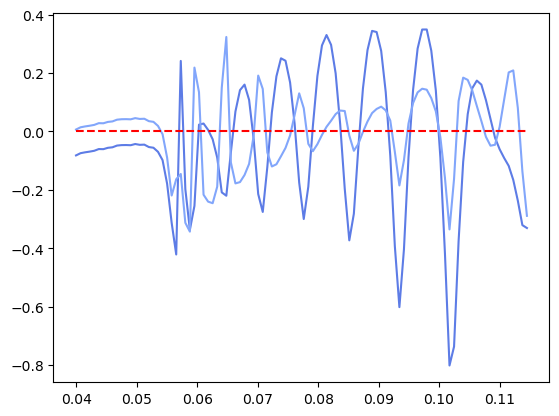

In [48]:
plt.figure()
data = loadRefData(file, xrng[0],xrng[1]) #this function loads to the data and converts the x-data from 2-theta to q
plt.plot(data.x, obj.residuals())
plt.plot(data.x, obj2.residuals())
plt.hlines(0, min(data.x), max(data.x), color='r', linestyle='--')

In [ ]:
obj2 = ana_xrr.run_simulation(file, xrng=[50, 150], level=2)
obj3 = ana_xrr.run_simulation(file, xrng=[50, 150], level=3)

Model will fit:
d_min: 0.03993566549561132 A
d_max: 0.1672738742028287 A



5.004600961688744: : 91it [00:07, 11.92it/s] 
/opt/anaconda3/lib/python3.11/site-packages/refnx/analysis/curvefitter.py:392: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  init_walkers = rng.multivariate_normal(


Figure saved at: /Users/sph/Downloads_test_reflectivity__20240822-131628.png
Text file saved at: /Users/sph/Downloads_test_reflectivity__20240822-131628.png
________________________________________________________________________________
Objective - 5752591504
Dataset = <None>, 170 points
datapoints = 170
chi2 = 9.912747503737679
Weighted = False
Transform = Transform('logY')
________________________________________________________________________________
Parameters:       ''       
________________________________________________________________________________
Parameters: 'instrument parameters'
<Parameter:    'scale'    , value=1.26935 +/- 0.145, bounds=[0.9, 1.5]>
<Parameter:     'bkg'     , value=5e-06 +/- 0.000793, bounds=[1e-09, 5e-06]>
<Parameter:'dq - resolution', value=0.05  (fixed) , bounds=[-inf, inf]>
<Parameter:  'q_offset'   , value=0.00379564 +/- 0.0102, bounds=[-0.1, 0.1]>
________________________________________________________________________________
Parameters: 'Str

100%|██████████| 1000/1000 [01:06<00:00, 15.11it/s]


________________________________________________________________________________
Objective - 5752591504
Dataset = <None>, 170 points
datapoints = 170
chi2 = 15.248563056799261
Weighted = False
Transform = Transform('logY')
________________________________________________________________________________
Parameters:       ''       
________________________________________________________________________________
Parameters: 'instrument parameters'
<Parameter:    'scale'    , value=1.29192 +/- 0.141, bounds=[0.9, 1.5]>
<Parameter:     'bkg'     , value=2.9137e-06 +/- 1.64e-06, bounds=[1e-09, 5e-06]>
<Parameter:'dq - resolution', value=0.05  (fixed) , bounds=[-inf, inf]>
<Parameter:  'q_offset'   , value=0.00185824 +/- 0.00222, bounds=[-0.1, 0.1]>
________________________________________________________________________________
Parameters: 'Structure - ' 
________________________________________________________________________________
Parameters:      'air'     
<Parameter: 'air - thick' , v

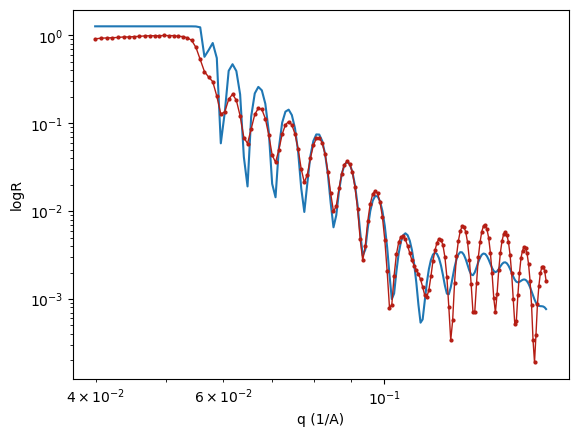

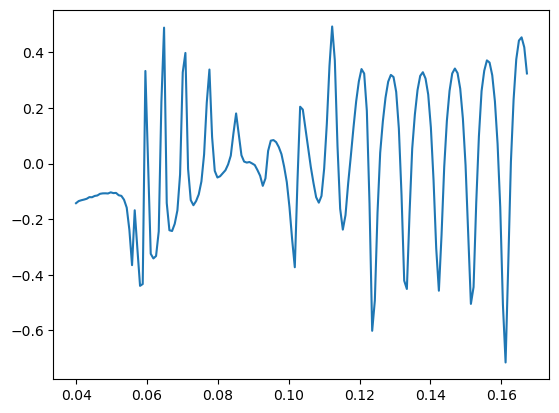

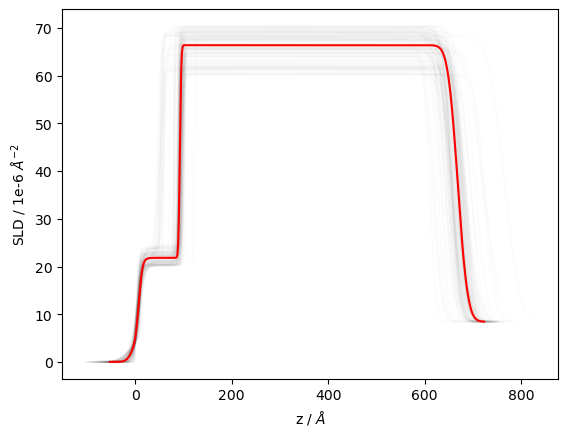

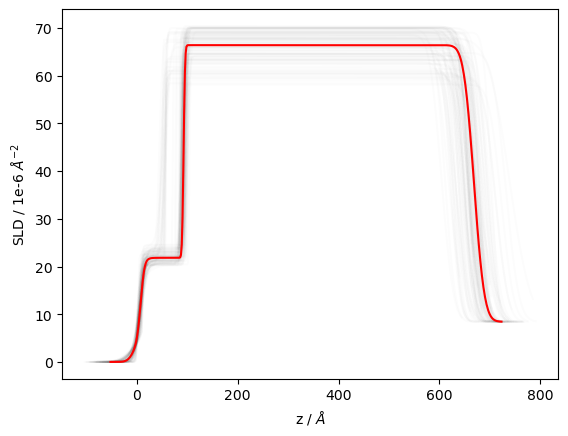

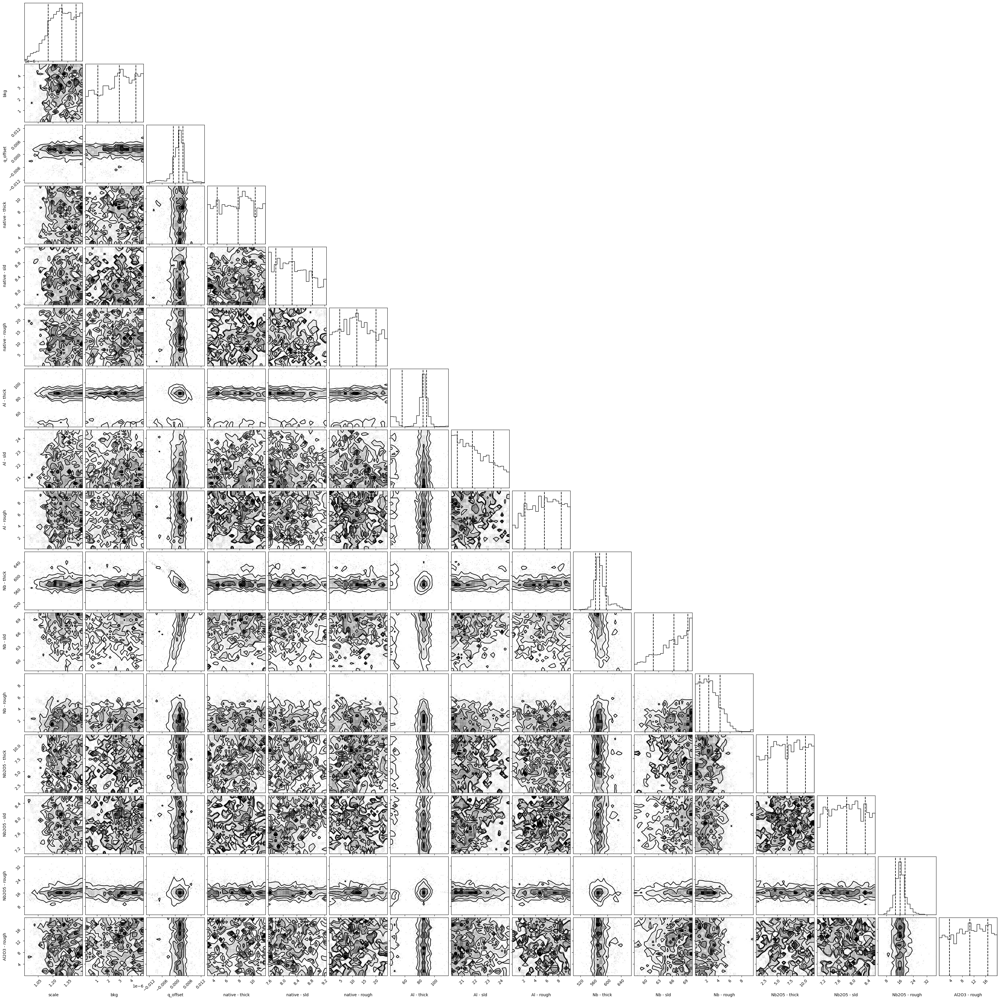

In [27]:
obj3 = ana_xrr.run_simulation(file, xrng=[50, 220], SLD_rng = 0.1)

In [ ]:
ana_xrr.plot_vary('bkg',[1e-6,3e-7,1e-7,3e-8,1e-8,3e-9] ,'Nb Single Vary Background',level=1)

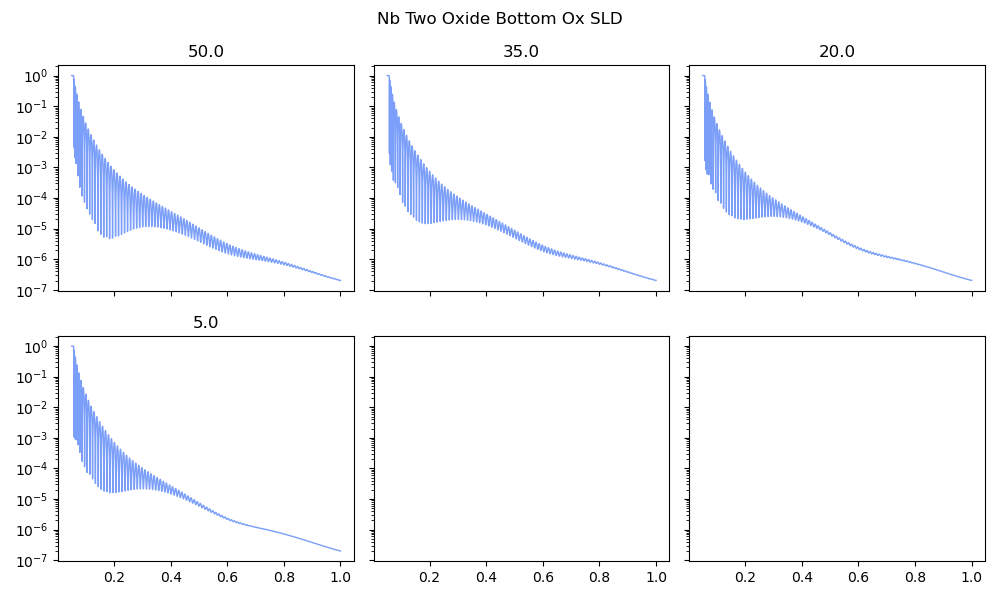

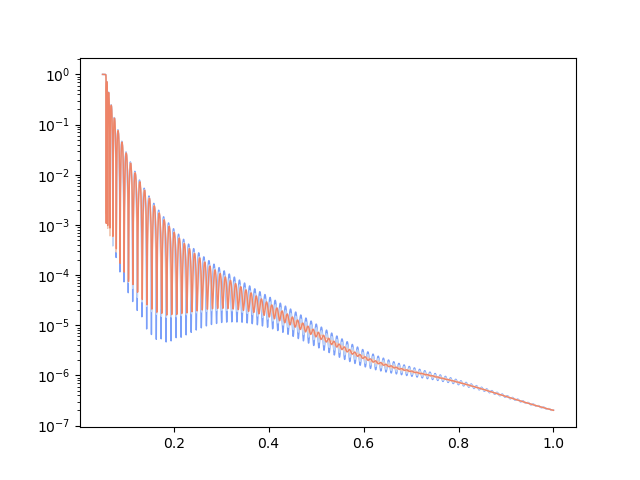

In [270]:
#ana_xrr.plot_vary('bkg',[3e-9,1e-8,3e-8,1e-7,3e-7,1e-6] ,'Nb Single Vary Background', level=0)

#ana_xrr.plot_vary('top_oxide_thk', np.linspace(0,10,6), 'Nb and Oxide Vary Ox Thickness', level=0.5)
#ana_xrr.plot_vary('top_oxide_rough', np.linspace(50,0,6), 'Nb and Oxide Vary Ox Roughness Long', level=0.5, cfg={'top_oxide_thk':30})

#ana_xrr.plot_vary('bottom_oxide_rough', np.linspace(0,5,4), 'Nb Two Oxide Vary Bottom Ox Roughness Long', level=0.75)
#ana_xrr.plot_vary('bottom_oxide_rough', np.linspace(0,5,4), 'Nb Two Oxide Vary Bottom Ox Roughness Long', level=3)

#ana_xrr.plot_vary('bottom_oxide_rough', np.linspace(0,5,4), 'Nb Two Oxide Vary Bottom Ox Roughness Short', q=np.linspace(0.05,0.25,1000), level=3)

ana_xrr.plot_vary('bottom_oxide_sld', np.linspace(50,5,4), 'Nb Two Oxide Bottom Ox SLD', level=0.75)


#ana_xrr.plot_vary('substrate_rough', np.linspace(0,3,6), 'Nb and Oxide Vary Substrate Roughness', level=0.5)


Model will fit:
d_min: 0.03993566549561132 A
d_max: 0.18987753780856884 A



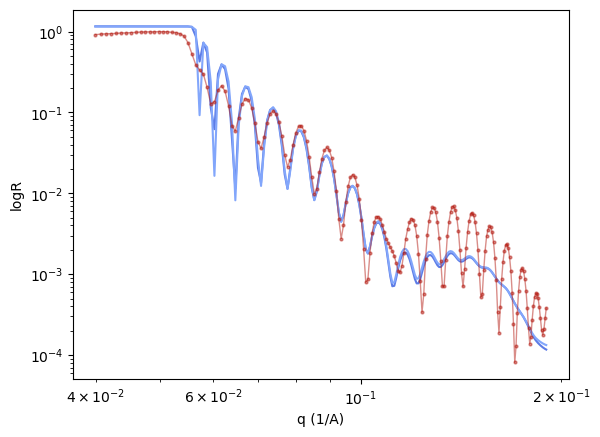

In [47]:
data = loadRefData(file, 50, 250) #this function loads to the data and converts the x-data from 2-theta to q
sns.set_palette('coolwarm',8)
fig1 = plt.figure() 

plt.semilogy(data.x, obj.model(data.x))
plt.semilogy(data.x, obj2.model(data.x))
#plt.semilogy(data.x, obj3.model(data.x))
plt.semilogy(data.x, data.y, '.-', color='#b51d14', linewidth=1, markersize=4, alpha=0.5)
plt.xlabel("q (1/A)")
plt.ylabel("logR")
plt.xscale('log')


In [20]:
al

Slab(Parameter(value=80.0, name='Al - thick', vary=False, bounds=Interval(lb=-np.inf, ub=np.inf), constraint=None), SLD([Parameter(value=22.191, name='Al - sld', vary=False, bounds=Interval(lb=-np.inf, ub=np.inf), constraint=None), Parameter(value=0.0, name='Al - isld', vary=False, bounds=Interval(lb=-np.inf, ub=np.inf), constraint=None)], name='Al'), Parameter(value=2.0, name='Al - rough', vary=False, bounds=Interval(lb=-np.inf, ub=np.inf), constraint=None), name='Al', vfsolv=Parameter(value=0.0, name='Al - volfrac solvent', vary=False, bounds=Interval(lb=0.0, ub=1.0), constraint=None), interface=None)

SLD_val_dict:  {'Al2O3': 8.419, 'Nb2O5': 7.794, 'Nb': 64.035, 'Al': 22.191, 'Ta': 112.931, 'air': 0, 'native': 28}  1e-6 A^-2


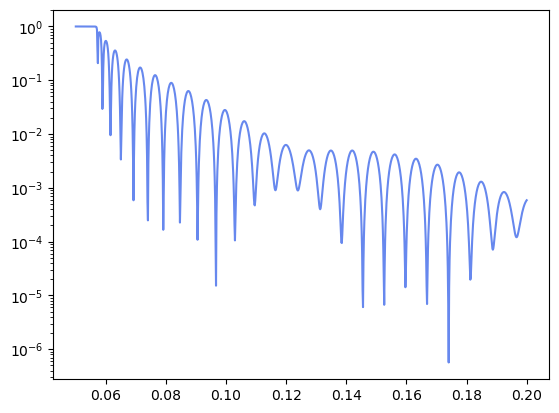

In [96]:
#Define dictionary of materials and corresponding SLDs. You may want to add Nb, for example

SLD_val_dict = {'Al2O3':8.419,
                'Nb2O5':7.794,
                'Nb':64.035,
               'Al' : 22.191,
               'Ta' : 112.931,
               'air': 0,
               'native': 28}
#       'Al2O3': 33.385,

#RefNX has SLD objects. I am going to make a dictionary of SLD objects named by the SLD_val_dict labels.
SLD_dict = dict()
for material in SLD_val_dict:
   SLD_dict[material] = SLD(SLD_val_dict[material], name = material)

print ("SLD_val_dict: ", SLD_val_dict, " 1e-6 A^-2")
## Load and clip data
#set the path to your file here. my files have no headers.
#path = r'C:\Users\abelson2\Documents\Quantum Computing Group\XRR\New folder\lv2.txt'


#Define slab parameters. Each row here is a new "slab", which is defined by an SLD, thickness, and roughness.
air = SLD_dict['air'](np.inf,0) #returns a slab with SLD = 0 (for air), infinite thickness, zero roughness.
top_oxide = SLD_dict['native'](8, 1) # this is al2o3 but hermal? 
top_al = SLD_dict['Al'](208,3)
JJ = SLD(15, name = 'JJ')(4, 2) #in this case I am just specifying an SLD rather than using a dictionary value.
JJ_buffer = SLD(15, name = 'JJ_buffer')(4, 2)
bottom_al = SLD_dict['Al'](282,2)

al = SLD_dict['Al'](80,2)
nb = SLD_dict['Nb'](800,1)
substrate = SLD_dict['Al2O3'](np.inf,1) # this is crystalline? 

level = 1 
if level == 1: 
    structure =  air | al | nb | substrate  
elif level==2: 
    structure =  air | top_oxide | top_al | JJ | JJ_buffer | bottom_al | substrate
model = ReflectModel(structure, bkg=3e-8, dq=0.05, scale = 1)

plt.figure()
q = np.linspace(0.05, 0.2, 1001)

#simplePlot(data.x, data.y, 'q (1/A)', 'Counts (a.u.)') #plot data
plt.semilogy(q, model(q))

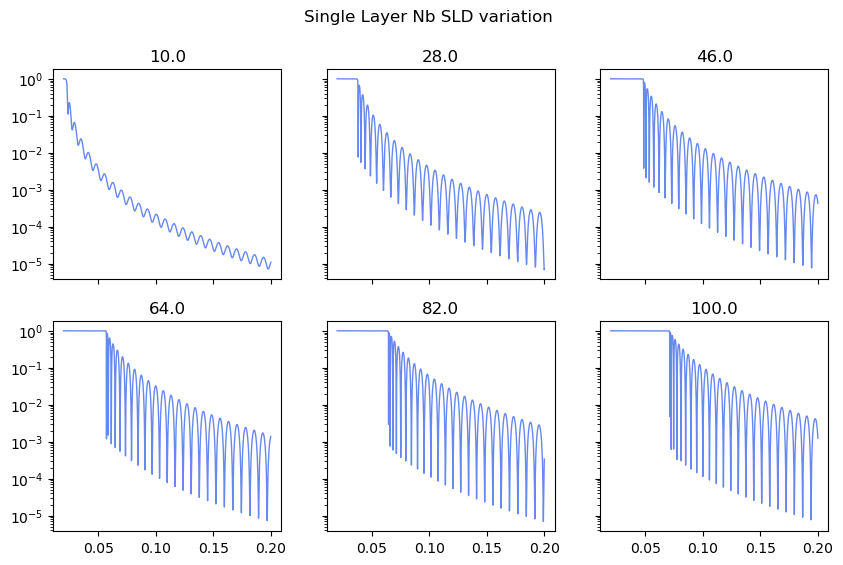

In [97]:
var = np.linspace(10,100,6) 
fig, ax = plt.subplots(2,3,sharey=True, sharex=True, figsize=(10,6)) 
ax = ax.flatten()
sns.set_palette('coolwarm',len(var))
q = np.linspace(0.02, 0.2, 10001)
SLD_dict = dict()
SLD_val_dict = {'Al2O3':8.419,
                    'Nb2O5':7.794,
                    'Nb':64.035,
                'Al' : 22.191,
                'Ta' : 112.931,
                'air': 0,
 }
for material in SLD_val_dict:
        SLD_dict[material] = SLD(SLD_val_dict[material], name = material)

for i, var in enumerate(var):
    SLD_dict['Nb'] = SLD(var, name = 'Nb')        
    nb = SLD_dict['Nb'](800,1)
    substrate = SLD_dict['Al2O3'](np.inf,1) # this is crystalline? 

    structure =  air | nb | substrate  
    #simplePlot(data.x, data.y, 'q (1/A)', 'Counts (a.u.)') #plot data
    model = ReflectModel(structure, bkg=3e-8, dq=0.05, scale = 1)

    ax[i].semilogy(q, model(q), linewidth=1)
    ax[i].set_title(var)
    fig.suptitle('Single Layer Nb SLD variation')
    plt.savefig('Single_Layer_Nb_varSLD.png')

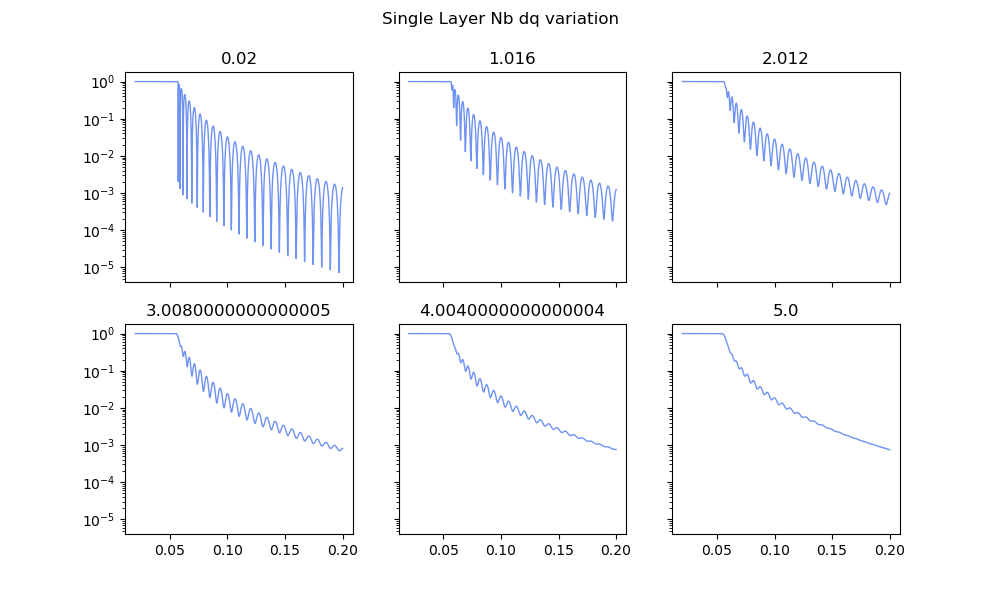

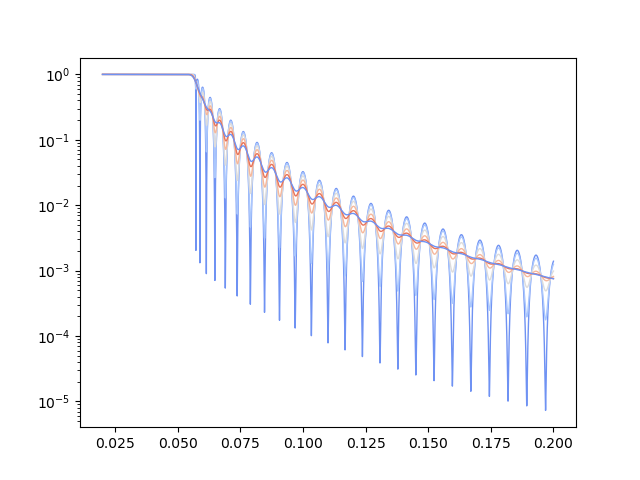

In [213]:
var = np.linspace(0.02,5,6) 
fig, ax = plt.subplots(2,3,sharey=True, sharex=True, figsize=(10,6)) 
ax = ax.flatten()
fig2, ax2 = plt.subplots(1,1)

sns.set_palette('coolwarm',len(var))
q = np.linspace(0.02, 0.2, 10001)
SLD_dict = dict()
SLD_val_dict = {'Al2O3':8.419,
                    'Nb':64.035,
                'Al' : 22.191,
                'air': 0}
for material in SLD_val_dict:
        SLD_dict[material] = SLD(SLD_val_dict[material], name = material)

for i, var in enumerate(var):
    nb = SLD_dict['Nb'](800,1)
    substrate = SLD_dict['Al2O3'](np.inf,1) # this is crystalline? 

    structure =  air | nb | substrate  
    #simplePlot(data.x, data.y, 'q (1/A)', 'Counts (a.u.)') #plot data
    model = ReflectModel(structure, bkg=3e-8, dq=var, scale = 1)

    ax[i].semilogy(q, model(q), linewidth=1)
    ax[i].set_title(var)
    fig.suptitle('Single Layer Nb dq variation')
    fig.savefig('Single_Layer_Nb_vardQ.png')

    ax2.semilogy(q, model(q), linewidth=1)



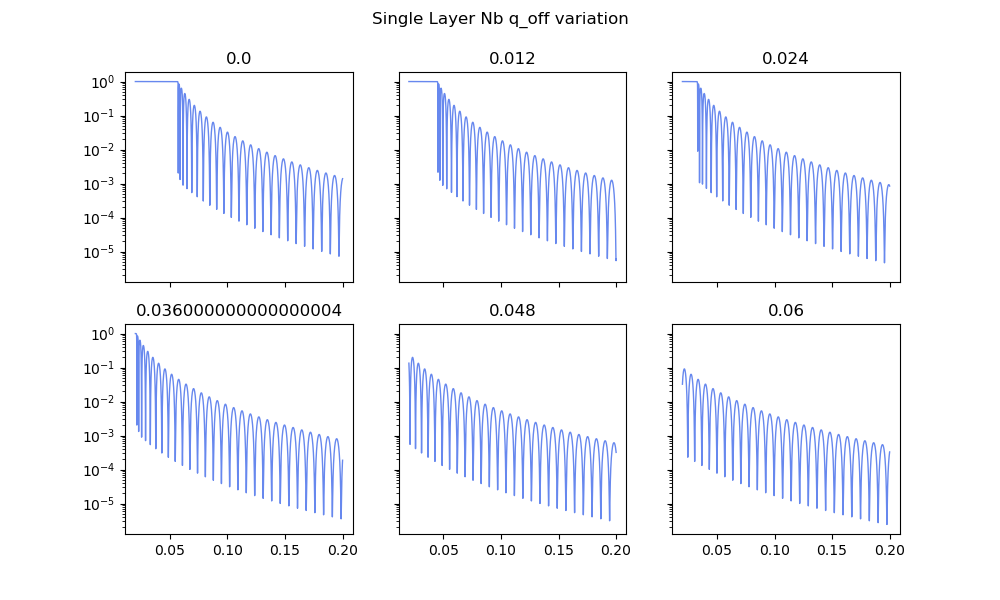

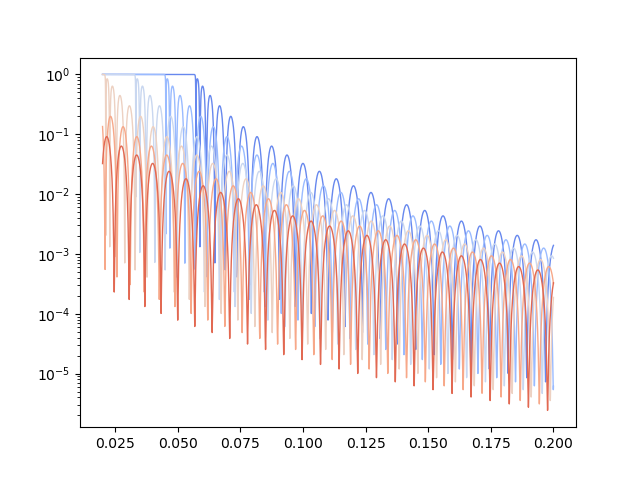

In [215]:
var = np.linspace(0.0,0.06,6) 
fig, ax = plt.subplots(2,3,sharey=True, sharex=True, figsize=(10,6)) 
ax = ax.flatten()
fig2, ax2 = plt.subplots(1,1)

sns.set_palette('coolwarm',len(var))
q = np.linspace(0.02, 0.2, 10001)
SLD_dict = dict()
SLD_val_dict = {'Al2O3':8.419,
                    'Nb':64.035,
                'Al' : 22.191,
                'air': 0}
for material in SLD_val_dict:
        SLD_dict[material] = SLD(SLD_val_dict[material], name = material)

for i, var in enumerate(var):
    nb = SLD_dict['Nb'](800,1)
    substrate = SLD_dict['Al2O3'](np.inf,1) # this is crystalline? 

    structure =  air | nb | substrate  
    model = ReflectModel(structure, bkg=3e-8, dq=0.05, scale = 1, q_offset=var)

    ax[i].semilogy(q, model(q), linewidth=1)
    ax[i].set_title(var)
    fig.suptitle('Single Layer Nb q_off variation')
    fig.savefig('Single_Layer_Nb_varqoff.png')

    ax2.semilogy(q, model(q), linewidth=1)

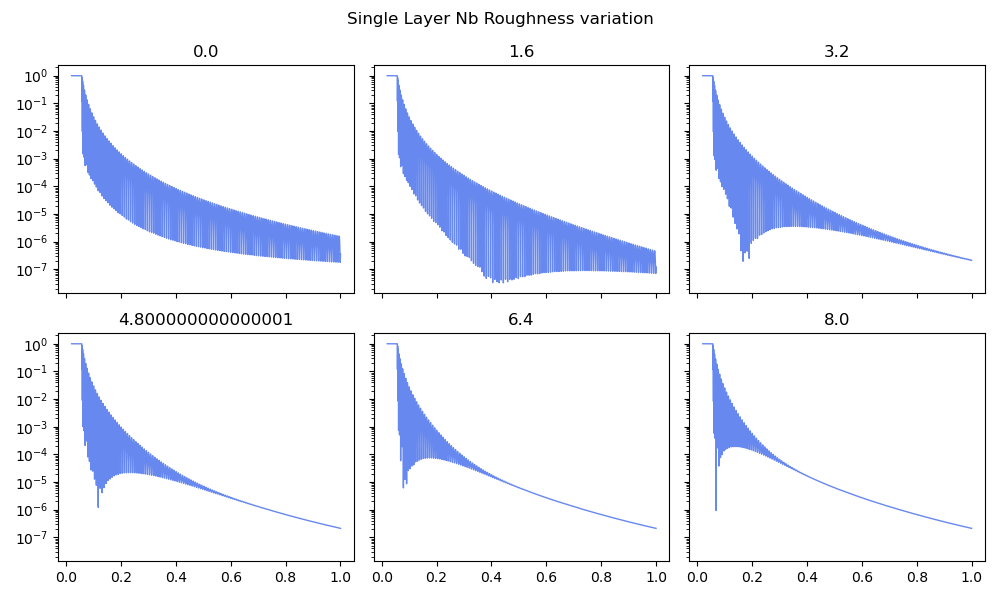

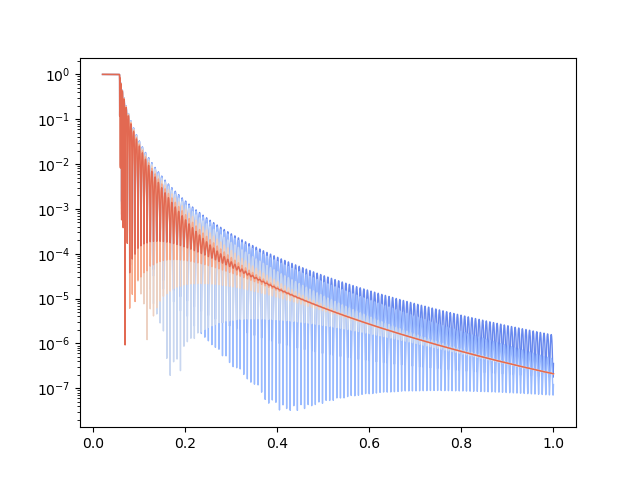

In [173]:

rough = np.linspace(0,8,6) 
sns.set_palette('coolwarm',len(rough))

fig, ax = plt.subplots(2,3,sharey=True, sharex=True, figsize=(10,6)) 
fig2, ax2 = plt.subplots(1,1)
ax = ax.flatten()

q = np.linspace(0.02, 1, 10001)
q2 = np.linspace(0.02, 0.2, 10001)
SLD_dict = dict()
SLD_val_dict = {'Al2O3':8.419,
                    'Nb':64.035,'air': 0,
                'Al' : 22.191}
for material in SLD_val_dict:
        SLD_dict[material] = SLD(SLD_val_dict[material], name = material)

for i, rough_val in enumerate(rough):    
    nb = SLD_dict['Nb'](800,rough_val)
    substrate = SLD_dict['Al2O3'](np.inf,1) # this is crystalline? 

    structure =  air | nb | substrate  
    #simplePlot(data.x, data.y, 'q (1/A)', 'Counts (a.u.)') #plot data
    model = ReflectModel(structure, bkg=3e-8, dq=0.05, scale = 1)

    ax[i].semilogy(q, model(q), linewidth=1)

    ax2.semilogy(q, model(q), linewidth=1)

    ax[i].set_title(rough_val)
    fig.tight_layout()
    fig.suptitle('Single Layer Nb Roughness variation')
    fig.savefig('Single_Layer_Nb_varRough.png')

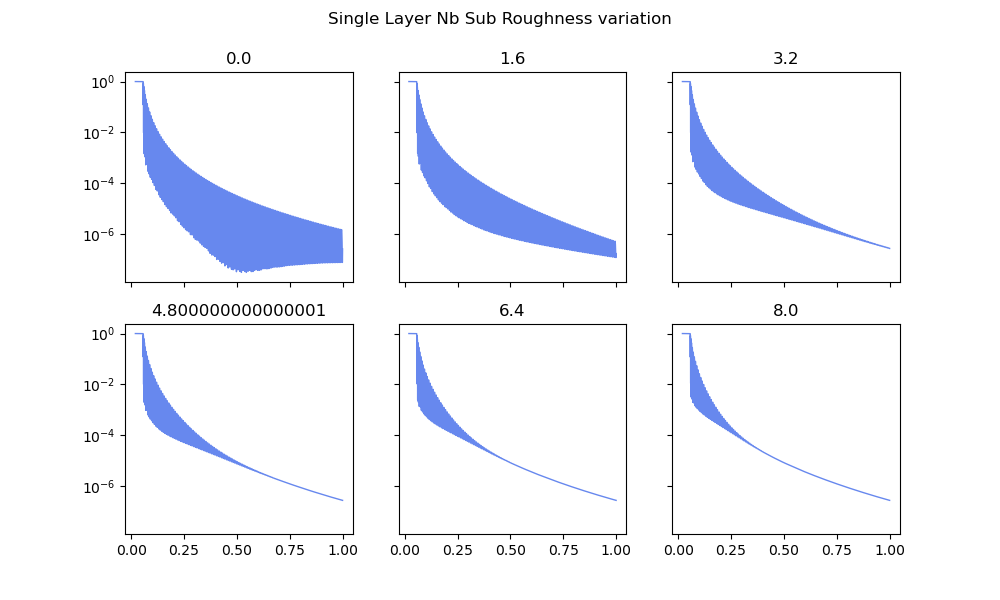

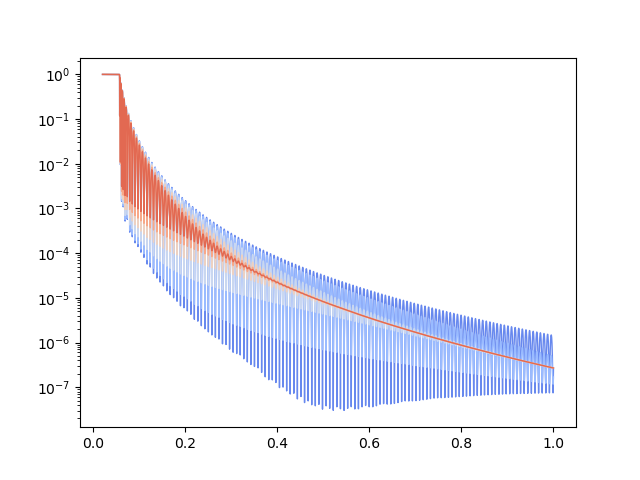

In [174]:
rough = np.linspace(0,8,6) 
sns.set_palette('coolwarm',len(rough))

fig, ax = plt.subplots(2,3,sharey=True, sharex=True, figsize=(10,6)) 
fig2, ax2 = plt.subplots(1,1)
ax = ax.flatten()

q = np.linspace(0.02, 1, 10001)
q2 = np.linspace(0.02, 1, 10001)
SLD_dict = dict()
SLD_val_dict = {'Al2O3':8.419,
                    'Nb':64.035,'air': 0,
                'Al' : 22.191}
for material in SLD_val_dict:
        SLD_dict[material] = SLD(SLD_val_dict[material], name = material)

for i, var in enumerate(rough):    
    nb = SLD_dict['Nb'](800,1)
    substrate = SLD_dict['Al2O3'](np.inf,var) # this is crystalline? 

    structure =  air | nb | substrate  
    #simplePlot(data.x, data.y, 'q (1/A)', 'Counts (a.u.)') #plot data
    model = ReflectModel(structure, bkg=3e-8, dq=0.05, scale = 1)

    ax[i].semilogy(q, model(q), linewidth=1)

    ax2.semilogy(q2, model(q2), linewidth=1)

    ax[i].set_title(var)
    fig.suptitle('Single Layer Nb Sub Roughness variation')
    fig.savefig('Single_Layer_Nb_SubvarRough.png')

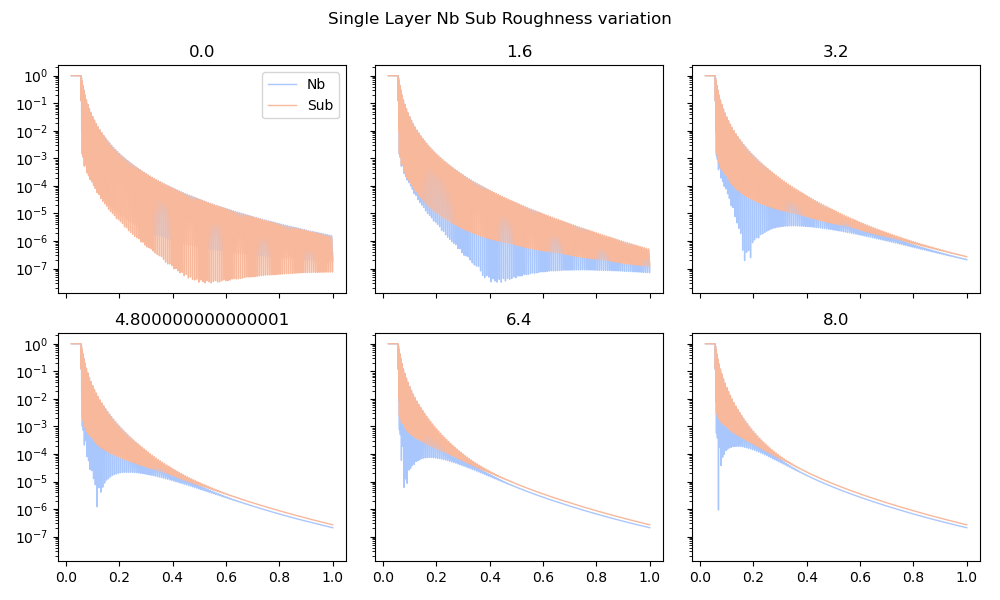

In [169]:
rough = np.linspace(0,8,6) 
sns.set_palette('coolwarm',2)

fig, ax = plt.subplots(2,3,sharey=True, sharex=True, figsize=(10,6)) 
ax = ax.flatten()

q = np.linspace(0.02, 1, 10001)
q2 = np.linspace(0.02, 0.2, 10001)
SLD_dict = dict()
SLD_val_dict = {'Al2O3':8.419,
                    'Nb':64.035,'air': 0,
                'Al' : 22.191}
for material in SLD_val_dict:
        SLD_dict[material] = SLD(SLD_val_dict[material], name = material)

for i, var in enumerate(rough):    
    nb = SLD_dict['Nb'](800,1)
    substrate = SLD_dict['Al2O3'](np.inf,var) # this is crystalline? 
    structure =  air | nb | substrate  
    model = ReflectModel(structure, bkg=3e-8, dq=0.05, scale = 1)

    nb = SLD_dict['Nb'](800,var)
    substrate = SLD_dict['Al2O3'](np.inf,1) # this is crystalline? 
    structure =  air | nb | substrate  
    model2 = ReflectModel(structure, bkg=3e-8, dq=0.05, scale = 1)
    ax[i].semilogy(q, model2(q), linewidth=1, label='Nb')
    ax[i].semilogy(q, model(q), linewidth=1, label='Sub')
    #ax[i].semilogy(q, model2(q), linewidth=1)


    ax[i].set_title(var)
ax[0].legend()
fig.suptitle('Single Layer Nb, Compare Nb/Sub Roughness variation')
fig.tight_layout()

fig.savefig('Single_Layer_Nb_SubNbvarRough.png')


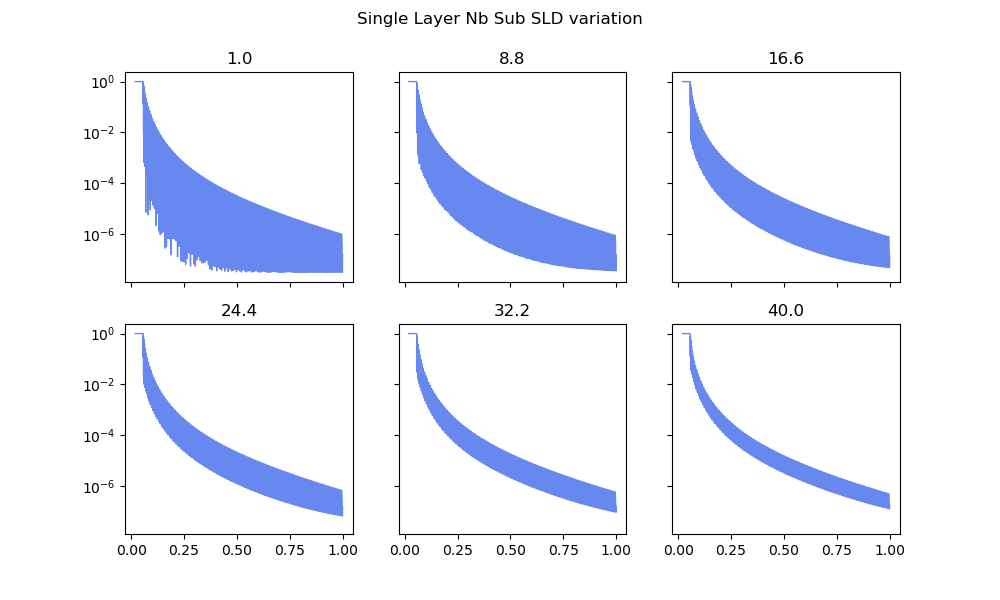

In [175]:
var_list = np.linspace(1,40,6) 
fig, ax = plt.subplots(2,3,sharey=True, sharex=True, figsize=(10,6)) 
ax = ax.flatten()

fig, ax = plt.subplots(2,3,sharey=True, sharex=True, figsize=(10,6)) 

sns.set_palette('coolwarm',len(var_list))
q = np.linspace(0.02, 0.2, 10001)
SLD_dict = dict()
SLD_val_dict = {'Al2O3':8.419,'air': 0,
                    'Nb':64.035}
for material in SLD_val_dict:
        SLD_dict[material] = SLD(SLD_val_dict[material], name = material)

for i, var in enumerate(var_list):
    SLD_dict['Al2O3'] = SLD(var, name = 'Al2O3')        
    nb = SLD_dict['Nb'](800,1)
    substrate = SLD_dict['Al2O3'](np.inf,1) # this is crystalline? 

    structure =  air | nb | substrate  
    #simplePlot(data.x, data.y, 'q (1/A)', 'Counts (a.u.)') #plot data
    model = ReflectModel(structure, bkg=3e-8, dq=0.05, scale = 1)

    ax[i].semilogy(q, model(q), linewidth=1)
    ax[i].set_title(var)
    plt.suptitle('Single Layer Nb Sub SLD variation')
    plt.savefig('Single_Layer_Nb_varSubSLD.png')

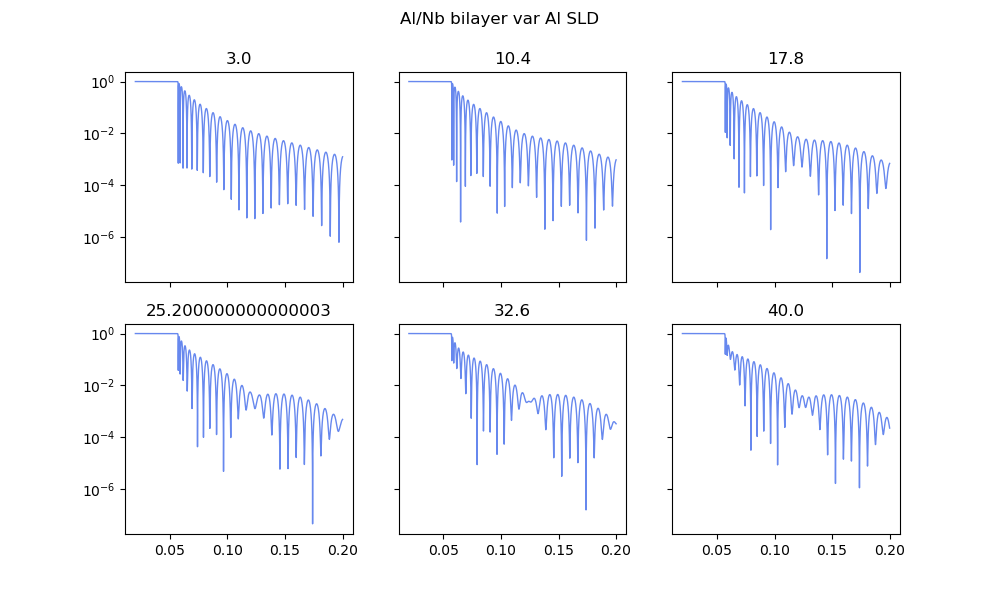

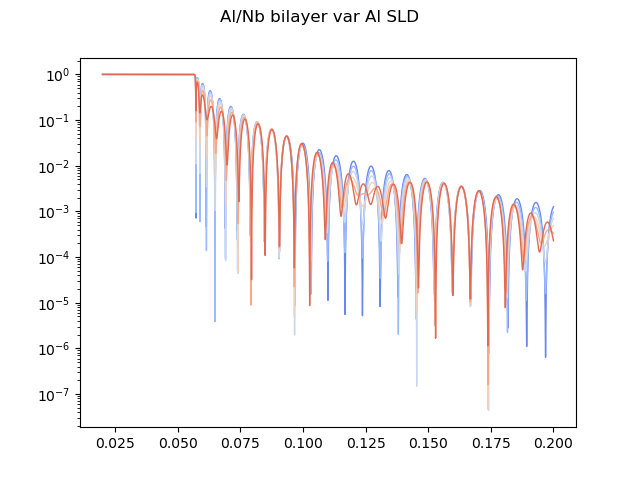

In [170]:
var_list = np.linspace(3,40,6) 
sns.set_palette('coolwarm',len(SLD_Nb))

fig, ax = plt.subplots(2,3,sharey=True, sharex=True, figsize=(10,6)) 
ax = ax.flatten()
fig2, ax2 = plt.subplots(1,1) 
q = np.linspace(0.02, 0.2, 10001)
SLD_dict = dict()
SLD_val_dict = {'Al2O3':8.419,'Al' : 22.191,'air': 0,
                    'Nb':64.035}
for material in SLD_val_dict:
        SLD_dict[material] = SLD(SLD_val_dict[material], name = material)

for i, var in enumerate(var_list):
    SLD_dict['Al'] = SLD(var, name = 'Al')        
    al = SLD_dict['Al'](80,1)

    nb = SLD_dict['Nb'](800,1)
    substrate = SLD_dict['Al2O3'](np.inf,1) # this is crystalline? 

    structure =  air | al | nb | substrate  
    #simplePlot(data.x, data.y, 'q (1/A)', 'Counts (a.u.)') #plot data
    model = ReflectModel(structure, bkg=3e-8, dq=0.05, scale = 1)

    ax[i].semilogy(q, model(q), linewidth=1)
    ax[i].set_title(var)
    ax2.semilogy(q, model(q), linewidth=1)
fig.suptitle('Al/Nb bilayer var Al SLD')
fig.savefig('TwoLayer_AlNb_varAl_SLD.png')

fig2.suptitle('Al/Nb bilayer var Al SLD')
fig2.savefig('TwoLayer_AlNb_varAl_SLD2.png')



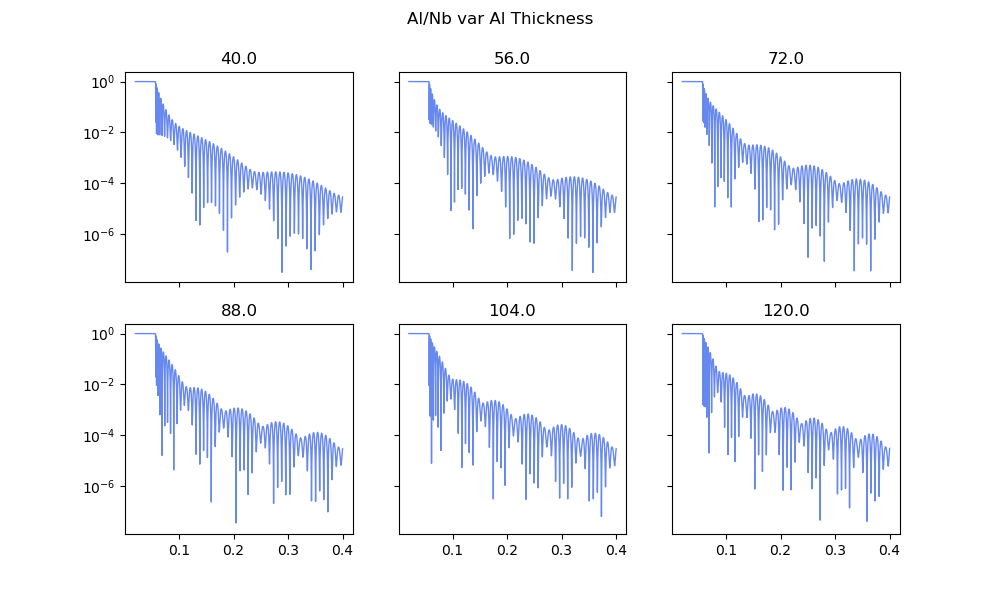

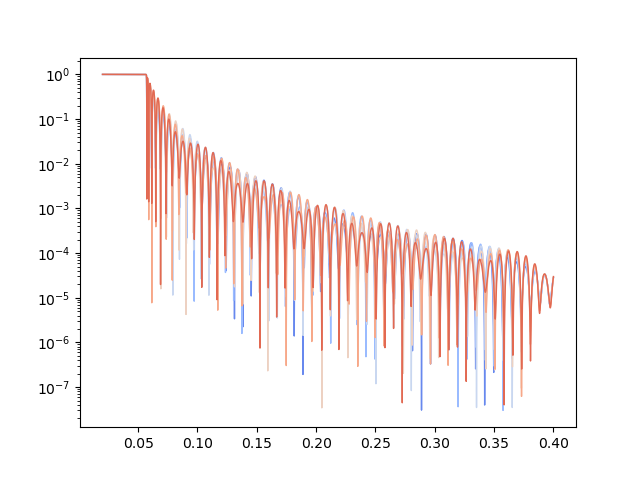

In [171]:
var_list = np.linspace(40,120,6) 
fig, ax = plt.subplots(2,3,sharey=True, sharex=True, figsize=(10,6)) 
ax = ax.flatten()
fig2, ax2 = plt.subplots(1,1) 
import seaborn as sns
sns.set_palette('coolwarm',len(SLD_Nb))
q = np.linspace(0.02, 0.4, 10001)
SLD_dict = dict()
SLD_val_dict = {'Al2O3':8.419,'Al' : 22.191,
                    'Nb':64.035}
for material in SLD_val_dict:
        SLD_dict[material] = SLD(SLD_val_dict[material], name = material)

for i, var in enumerate(var_list):
    
    al = SLD_dict['Al'](var,1)

    nb = SLD_dict['Nb'](800,1)
    substrate = SLD_dict['Al2O3'](np.inf,1) # this is crystalline? 

    structure =  air | al | nb | substrate  
    #simplePlot(data.x, data.y, 'q (1/A)', 'Counts (a.u.)') #plot data
    model = ReflectModel(structure, bkg=3e-8, dq=0.05, scale = 1)

    ax[i].semilogy(q, model(q), linewidth=1)
    ax[i].set_title(var)
    ax2.semilogy(q, model(q), linewidth=1)

fig.suptitle('Al/Nb var Al Thickness')
fig.savefig('TwoLayer_AlNb_varAlThick.png')



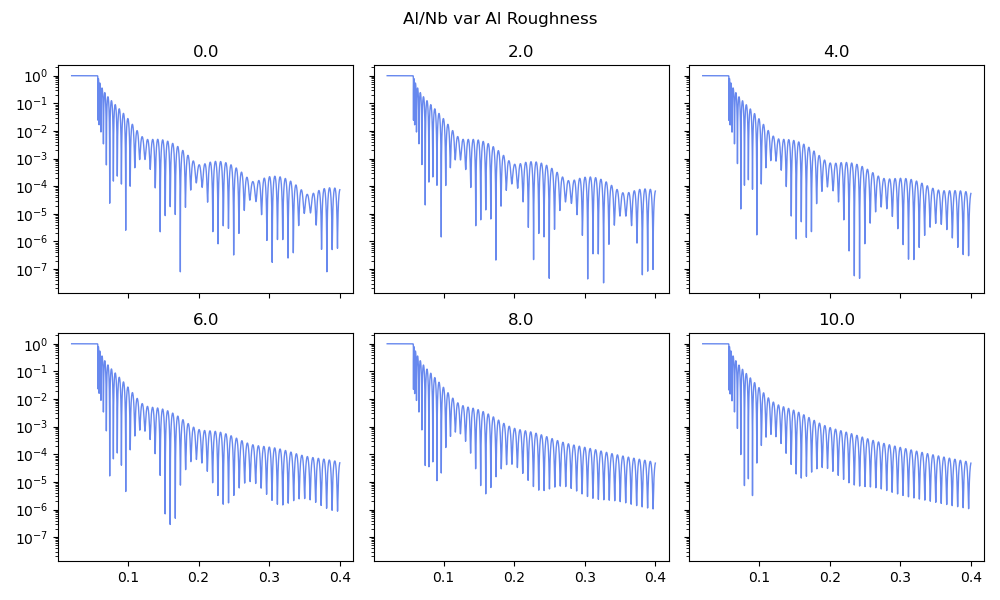

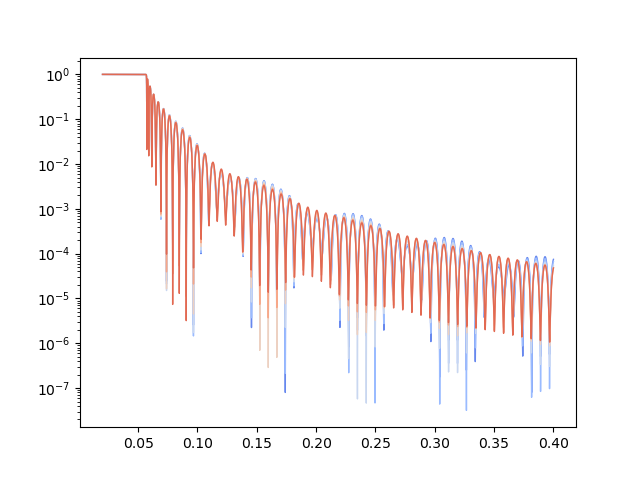

In [180]:
sns.set_palette('coolwarm',len(var_list))

var_list = np.linspace(0,10,6) 
fig, ax = plt.subplots(2,3,sharey=True, sharex=True, figsize=(10,6)) 
ax = ax.flatten()
fig2, ax2 = plt.subplots(1,1) 

q = np.linspace(0.02, 0.4, 10001)
SLD_dict = dict()
SLD_val_dict = {'Al2O3':8.419,'Al' : 22.191,
                    'Nb':64.035}
for material in SLD_val_dict:
        SLD_dict[material] = SLD(SLD_val_dict[material], name = material)

for i, var in enumerate(var_list):
    
    al = SLD_dict['Al'](80,var)
    nb = SLD_dict['Nb'](800,1)
    substrate = SLD_dict['Al2O3'](np.inf,1) # this is crystalline? 

    structure =  air | al | nb | substrate  
    #simplePlot(data.x, data.y, 'q (1/A)', 'Counts (a.u.)') #plot data
    model = ReflectModel(structure, bkg=3e-8, dq=0.05, scale = 1)

    ax[i].semilogy(q, model(q), linewidth=1)
    ax[i].set_title(var)
    ax2.semilogy(q, model(q), linewidth=1)

fig.suptitle('Al/Nb var Al Roughness')
fig.tight_layout()

fig.savefig('TwoLayer_AlNb_varAlRoughness.png')

    

## Set up comparison 

NameError: name 'air' is not defined

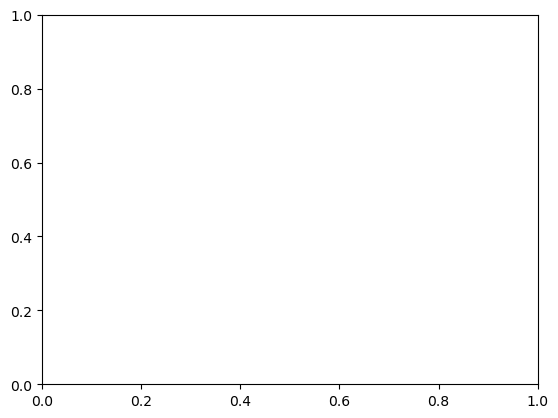

In [80]:
fig2, ax2 = plt.subplots(1,1) 
sns.set_palette('coolwarm',5)
q = np.linspace(0.02, 0.2, 10001)
SLD_dict = dict()
SLD_val_dict = {'Al2O3':8.419,'Al' : 22.191,
                    'Nb':44.035}
for material in SLD_val_dict:
        SLD_dict[material] = SLD(SLD_val_dict[material], name = material)

al = SLD_dict['Al'](50,2)
nb = SLD_dict['Nb'](600,1)
substrate = SLD_dict['Al2O3'](np.inf,0) # this is crystalline? 
structure =  air | al | nb | substrate  
model = ReflectModel(structure, bkg=3e-8, dq=0.05, scale = 1, q_offset=-0.01)
ax2.semilogy(q, model(q), linewidth=1)
simplePlot(data.x, data.y, 'q (1/A)', 'Counts (a.u.)') #plot data

### Define layer stack and set model bounds

Model will fit:
d_min: 0.04370313326908997 A
d_max: 0.1672738742028287 A



4.184650741134336: : 87it [00:02, 31.17it/s] 


Figure saved at: /Users/sph/Downloads_lv2_fit_reflectivity__20240822-081610.png
Text file saved at: /Users/sph/Downloads_lv2_fit_reflectivity__20240822-081610.png
________________________________________________________________________________
Objective - 14987841360
Dataset = <None>, 165 points
datapoints = 165
chi2 = 8.358352784084136
Weighted = False
Transform = Transform('logY')
________________________________________________________________________________
Parameters:       ''       
________________________________________________________________________________
Parameters: 'instrument parameters'
<Parameter:    'scale'    , value=1.0978 +/- 0.103, bounds=[0.9, 1.5]>
<Parameter:     'bkg'     , value=5e-07 +/- 0.000471, bounds=[1e-09, 5e-07]>
<Parameter:'dq - resolution', value=0.05  (fixed) , bounds=[-inf, inf]>
<Parameter:  'q_offset'   , value=0.00718441 +/- 0.00253, bounds=[-0.1, 0.1]>
________________________________________________________________________________
Parameter

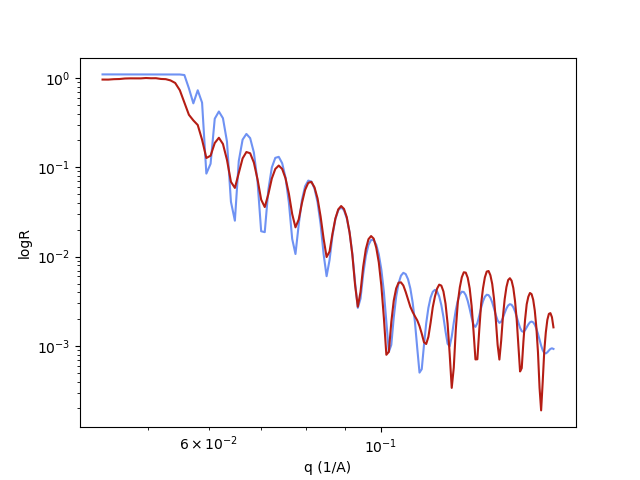

In [331]:
level = 1 
if level == 1: 
    structure =  air | al | nb | substrate  
elif level==2: 
    structure =  air | top_oxide | top_al | JJ | JJ_buffer | bottom_al | substrate
    
#plt.plot(*structure.sld_profile())
#plt.ylabel("SLD /$10^{-6} \\AA^{-2}$")
#plt.xlabel("distance / $\\AA$");

model = ReflectModel(structure, bkg=3e-8, dq=0.05, scale = 1, q_offset=-0.01)

model.bkg.setp(bounds = (1e-9, 5e-7), vary = True) #background
model.scale.setp(bounds = (0.9, 1.5), vary = True) # maximum value
model.q_offset.setp(bounds = (-.1, 0.1), vary = True) # due to error? 

al.thick.setp(bounds = (40,120), vary = True)
al.sld.real.setp(bounds = (16,35), vary = True)
al.rough.setp(bounds = (0,10), vary = True)
    
nb.thick.setp(bounds = (300,900), vary = True)
nb.sld.real.setp(bounds = (40,80), vary = True)
nb.rough.setp(bounds = (0,10), vary = True)

substrate.rough.setp(bounds = (0,20), vary=True)
substrate.sld.real.setp(bounds = (2,30), vary=True)

if level>1: 
    top_oxide.thick.setp(bounds = (3,12), vary = True)
    top_oxide.rough.setp(bounds = (0,20), vary = True)
    top_oxide.sld.real.setp(bounds = (20,34), vary = True)

x_start = 55
x_end = 220
data = loadRefData(file, x_start, x_end) #this function loads to the data and converts the x-data from 2-theta to q

objective = Objective(model, data, transform=Transform("logY"))

#Does the curve fitting
fitter = CurveFitter(objective)
fitter.fit("differential_evolution")

#fig1, ax1 = objective.plot();
plt.figure() 
plt.semilogy(data.x, objective.model(data.x))
plt.semilogy(data.x, data.y, color='#b51d14')
plt.xlabel("q (1/A)")
plt.ylabel("logR")
plt.xscale('log')

save_name = "lv2_fit" #enter name to save file with (also adds timestamp)

if True: #toggle True to save fit figure, False to not save.
    save_name += "_reflectivity_"
    out = save_fig(fig1, path, save_name) #save file with filename specified here
    print ("Figure saved at:", out)

if True: #toggle True to save fit file, False to not save.
    save_name += "_objective_"
    save_text(str(objective), path, save_name)
    print ("Text file saved at:", out)

if True: #toggle True to print the full fit, false to not print.
    print(objective)

Model will fit:
d_min: 0.04370313326908997 A
d_max: 0.1672738742028287 A



2.747672916162073: : 186it [00:07, 23.75it/s] 


Figure saved at: /Users/sph/Downloads_lv2_fit_reflectivity__20240822-082403.png
Text file saved at: /Users/sph/Downloads_lv2_fit_reflectivity__20240822-082403.png
________________________________________________________________________________
Objective - 15015336464
Dataset = <None>, 165 points
datapoints = 165
chi2 = 5.492706785626037
Weighted = False
Transform = Transform('logY')
________________________________________________________________________________
Parameters:       ''       
________________________________________________________________________________
Parameters: 'instrument parameters'
<Parameter:    'scale'    , value=1.12808 +/- 0.12 , bounds=[0.9, 1.5]>
<Parameter:     'bkg'     , value=5e-06 +/- 0.000509, bounds=[1e-09, 5e-06]>
<Parameter:'dq - resolution', value=0.05  (fixed) , bounds=[-inf, inf]>
<Parameter:  'q_offset'   , value=6.58141e-05 +/- 0.00198, bounds=[-0.1, 0.1]>
________________________________________________________________________________
Paramet

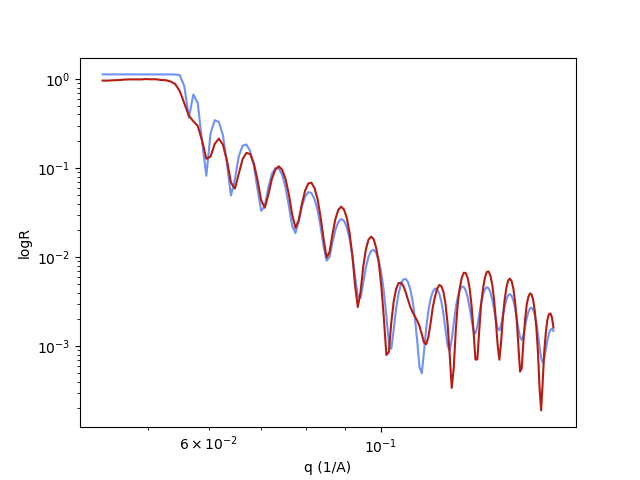

In [349]:
level = 2 
if level == 1: 
    structure =  air | al | nb | substrate  
elif level==2: 
    structure =  air | top_oxide | al | nb | substrate  
    
#plt.plot(*structure.sld_profile())
#plt.ylabel("SLD /$10^{-6} \\AA^{-2}$")
#plt.xlabel("distance / $\\AA$");

model = ReflectModel(structure, bkg=3e-8, dq=0.05, scale = 1, q_offset=-0.01)

model.bkg.setp(bounds = (1e-9, 5e-6), vary = True) #background
model.scale.setp(bounds = (0.9, 1.5), vary = True) # maximum value
model.q_offset.setp(bounds = (-.1, 0.1), vary = True) # due to error? 

al.thick.setp(bounds = (40,120), vary = True)
al.sld.real.setp(bounds = (5,45), vary = True)
al.rough.setp(bounds = (0,10), vary = True)
    
nb.thick.setp(bounds = (300,900), vary = True)
nb.sld.real.setp(bounds = (40,90), vary = True)
nb.rough.setp(bounds = (0,10), vary = True)

substrate.rough.setp(bounds = (0,20), vary=True)
substrate.sld.real.setp(bounds = (2,60), vary=True)

if level>1: 
    top_oxide.thick.setp(bounds = (3,12), vary = True)
    top_oxide.rough.setp(bounds = (0,25), vary = True)
    top_oxide.sld.real.setp(bounds = (20,34), vary = True)

x_start = 55
x_end = 220
data = loadRefData(file, x_start, x_end) #this function loads to the data and converts the x-data from 2-theta to q

objective2 = Objective(model, data, transform=Transform("logY"))

#Does the curve fitting
fitter = CurveFitter(objective2)
fitter.fit("differential_evolution")

#fig1, ax1 = objective.plot();
plt.figure() 
#plt.semilogy(data.x, objective.model(data.x))
plt.semilogy(data.x, objective2.model(data.x))
plt.semilogy(data.x, data.y, color='#b51d14')
plt.xlabel("q (1/A)")
plt.ylabel("logR")
plt.xscale('log')

save_name = "lv2_fit" #enter name to save file with (also adds timestamp)

if True: #toggle True to save fit figure, False to not save.
    save_name += "_reflectivity_"
    out = save_fig(fig1, path, save_name) #save file with filename specified here
    print ("Figure saved at:", out)

if True: #toggle True to save fit file, False to not save.
    save_name += "_objective_"
    save_text(str(objective2), path, save_name)
    print ("Text file saved at:", out)

if True: #toggle True to print the full fit, false to not print.
    print(objective2)

Model will fit:
d_min: 0.04370313326908997 A
d_max: 0.2652205158537652 A



10.0142441241311: : 235it [00:09, 23.83it/s]  


Figure saved at: /Users/sph/Downloads_lv2_fit_reflectivity__20240822-082525.png
Text file saved at: /Users/sph/Downloads_lv2_fit_reflectivity__20240822-082525.png
________________________________________________________________________________
Objective - 15014928208
Dataset = <None>, 295 points
datapoints = 295
chi2 = 20.019894071924334
Weighted = False
Transform = Transform('logY')
________________________________________________________________________________
Parameters:       ''       
________________________________________________________________________________
Parameters: 'instrument parameters'
<Parameter:    'scale'    , value=1.25352 +/- 0.197, bounds=[0.9, 1.5]>
<Parameter:     'bkg'     , value=6.16975e-07 +/- 5.01e-05, bounds=[1e-09, 5e-06]>
<Parameter:'dq - resolution', value=0.05  (fixed) , bounds=[-inf, inf]>
<Parameter:  'q_offset'   , value=0.00422059 +/- 0.00097, bounds=[-0.1, 0.1]>
________________________________________________________________________________
P

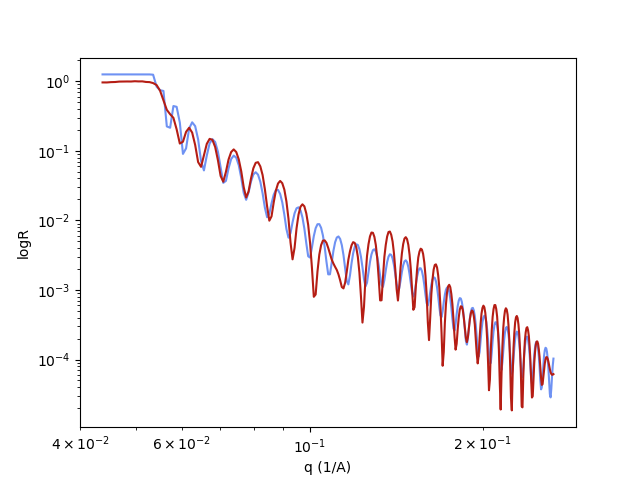

In [351]:
level = 2 
if level == 1: 
    structure =  air | al | nb | substrate  
elif level==2: 
    structure =  air | top_oxide | al | nb | substrate  
    
#plt.plot(*structure.sld_profile())
#plt.ylabel("SLD /$10^{-6} \\AA^{-2}$")
#plt.xlabel("distance / $\\AA$");

model = ReflectModel(structure, bkg=3e-8, dq=0.05, scale = 1, q_offset=-0.01)

model.bkg.setp(bounds = (1e-9, 5e-6), vary = True) #background
model.scale.setp(bounds = (0.9, 1.5), vary = True) # maximum value
model.q_offset.setp(bounds = (-.1, 0.1), vary = True) # due to error? 

al.thick.setp(bounds = (40,120), vary = True)
al.sld.real.setp(bounds = (5,45), vary = True)
al.rough.setp(bounds = (0,10), vary = True)
    
nb.thick.setp(bounds = (300,900), vary = True)
nb.sld.real.setp(bounds = (40,90), vary = True)
nb.rough.setp(bounds = (0,10), vary = True)

substrate.rough.setp(bounds = (0,20), vary=True)
substrate.sld.real.setp(bounds = (2,60), vary=True)

if level>1: 
    top_oxide.thick.setp(bounds = (3,12), vary = True)
    top_oxide.rough.setp(bounds = (0,25), vary = True)
    top_oxide.sld.real.setp(bounds = (20,34), vary = True)

x_start = 55
x_end = 350
data = loadRefData(file, x_start, x_end) #this function loads to the data and converts the x-data from 2-theta to q

objective2 = Objective(model, data, transform=Transform("logY"))

#Does the curve fitting
fitter = CurveFitter(objective2)
fitter.fit("differential_evolution")

#fig1, ax1 = objective.plot();
plt.figure() 
#plt.semilogy(data.x, objective.model(data.x))
plt.semilogy(data.x, objective2.model(data.x))
plt.semilogy(data.x, data.y, color='#b51d14')
plt.xlabel("q (1/A)")
plt.ylabel("logR")
plt.xscale('log')

save_name = "lv2_fit" #enter name to save file with (also adds timestamp)

if True: #toggle True to save fit figure, False to not save.
    save_name += "_reflectivity_"
    out = save_fig(fig1, path, save_name) #save file with filename specified here
    print ("Figure saved at:", out)

if True: #toggle True to save fit file, False to not save.
    save_name += "_objective_"
    save_text(str(objective2), path, save_name)
    print ("Text file saved at:", out)

if True: #toggle True to print the full fit, false to not print.
    print(objective2)

In [ ]:
level = 3
if level == 1: 
    structure =  air | al | nb | substrate  
elif level==2: 
    structure =  air | top_oxide | al | nb | substrate  
elif level==3: 
    structure =  air | top_oxide | al | nb | bottom_oxide | substrate  
#plt.plot(*structure.sld_profile())
#plt.ylabel("SLD /$10^{-6} \\AA^{-2}$")
#plt.xlabel("distance / $\\AA$");

model = ReflectModel(structure, bkg=3e-8, dq=0.05, scale = 1, q_offset=-0.01)

model.bkg.setp(bounds = (1e-9, 5e-6), vary = True) #background
model.scale.setp(bounds = (0.9, 1.5), vary = True) # maximum value
model.q_offset.setp(bounds = (-.1, 0.1), vary = True) # due to error? 

al.thick.setp(bounds = (40,120), vary = True)
al.sld.real.setp(bounds = (5,45), vary = True)
al.rough.setp(bounds = (0,10), vary = True)
    
nb.thick.setp(bounds = (300,900), vary = True)
nb.sld.real.setp(bounds = (40,90), vary = True)
nb.rough.setp(bounds = (0,10), vary = True)

substrate.rough.setp(bounds = (0,20), vary=True)
substrate.sld.real.setp(bounds = (2,60), vary=True)

if level>1: 
    top_oxide.thick.setp(bounds = (3,12), vary = True)
    top_oxide.rough.setp(bounds = (0,25), vary = True)
    top_oxide.sld.real.setp(bounds = (20,34), vary = True)

x_start = 55
x_end = 350
data = loadRefData(file, x_start, x_end) #this function loads to the data and converts the x-data from 2-theta to q

objective2 = Objective(model, data, transform=Transform("logY"))

#Does the curve fitting
fitter = CurveFitter(objective2)
fitter.fit("differential_evolution")

#fig1, ax1 = objective.plot();
plt.figure() 
#plt.semilogy(data.x, objective.model(data.x))
plt.semilogy(data.x, objective2.model(data.x))
plt.semilogy(data.x, data.y, color='#b51d14')
plt.xlabel("q (1/A)")
plt.ylabel("logR")
plt.xscale('log')

save_name = "lv2_fit" #enter name to save file with (also adds timestamp)

if True: #toggle True to save fit figure, False to not save.
    save_name += "_reflectivity_"
    out = save_fig(fig1, path, save_name) #save file with filename specified here
    print ("Figure saved at:", out)

if True: #toggle True to save fit file, False to not save.
    save_name += "_objective_"
    save_text(str(objective2), path, save_name)
    print ("Text file saved at:", out)

if True: #toggle True to print the full fit, false to not print.
    print(objective2)

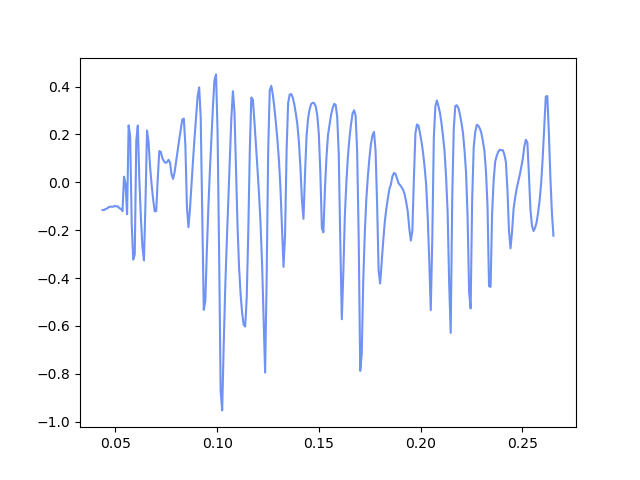

In [353]:
plt.figure()
#plt.plot(data.x, objective.residuals())
plt.plot(data.x, objective2.residuals())

100%|██████████| 1500/1500 [00:34<00:00, 42.95it/s]


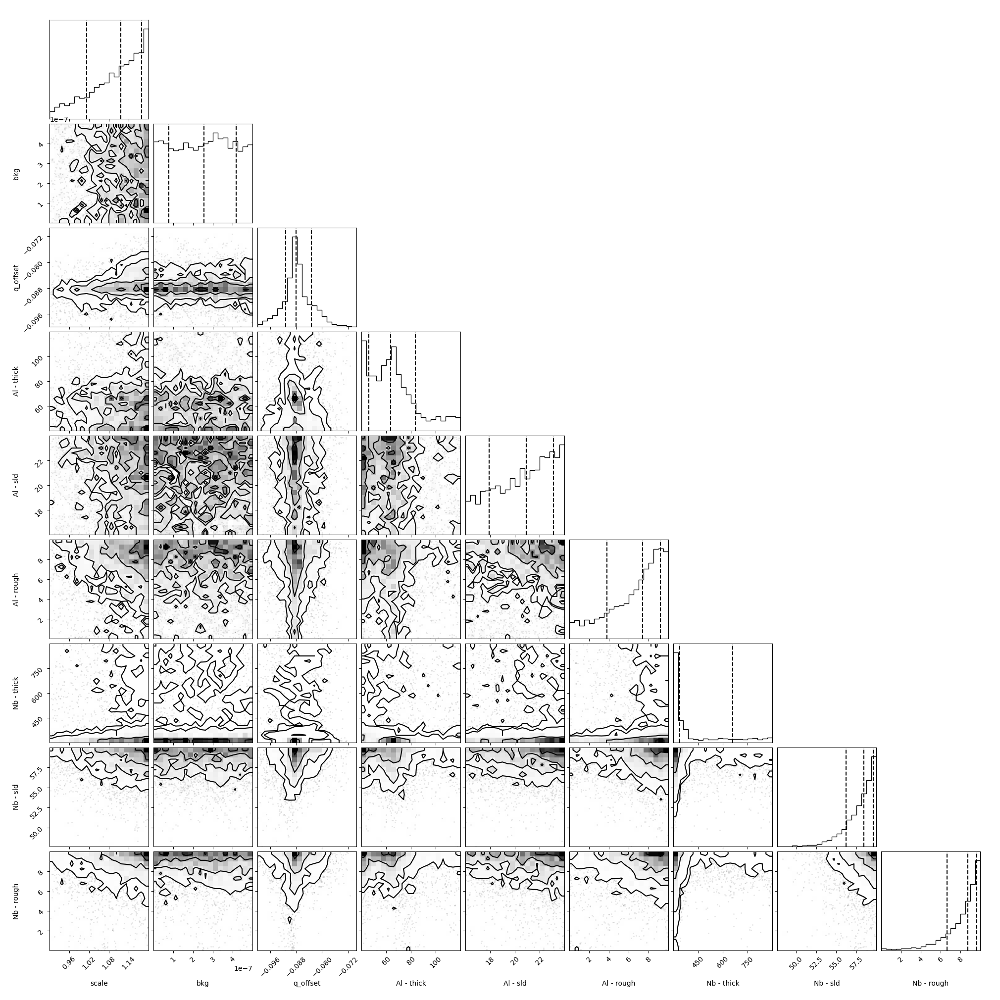

In [232]:
fitter.sample(400, pool=1)
fitter.reset()
res = fitter.sample(15, nthin=100, pool=1)
objective.corner();



## Fit the Model

### Plot Fit

### Plot SLD Profile from Fit

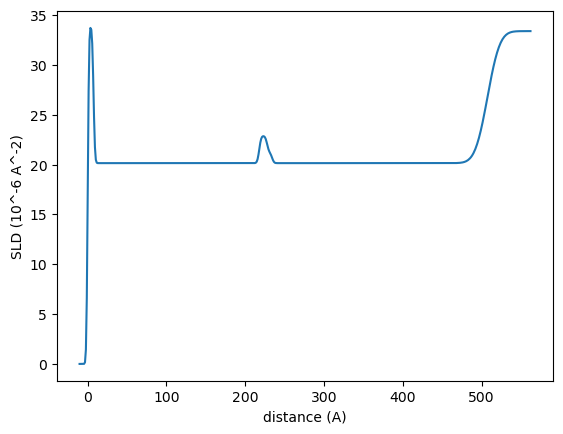

Figure saved at: C:\Users\abelson2\Documents\Quantum Computing Group\XRR\New folder\lv2_lv2_fit_objective__20240816-114959.png


In [25]:
save_name = "lv2_fit" #enter name to save file with (also adds timestamp)

fig, ax = plotOut(structure.sld_profile()[0], structure.sld_profile()[1], "distance (A)", "SLD (10^-6 A^-2)")

if True: #toggle True to save fit SLD figure, False to not save.
    save_name += "_objective_"
    out = save_fig(fig1, path, save_name) #save file with filename specified here
    print ("Figure saved at:", out)

## Optimize fit using Markov Chain Monte Carlo model (unclear how useful; typically skip)

In [40]:
fitter.sample(20, pool=1)
fitter.reset()
res = fitter.sample(10, nthin=100, pool=1)
structure.plot(samples = 100)
fig,ax = structure.plot(samples = 100)
corner_plot = objective.corner();

## Plot the fit residual

In [312]:
plt.plot(data.x, objective.residuals())

## Calculate power spectrum of residual to identify missing layers

In [323]:

from scipy import signal

mpld3.enable_notebook()

x = objective.residuals()
fs = 1/((max(data.x) - min(data.x)) / len(data.x))
f, Pxx_den = signal.periodogram(x, fs)
plt.semilogy(f, Pxx_den)
plt.ylim([1e-9, 1e0])
plt.xlabel('length scale [A]')
plt.ylabel('PSD [V**2/Hz]')
plt.show()

mpld3.disable_notebook()

NameError: name 'objective' is not defined

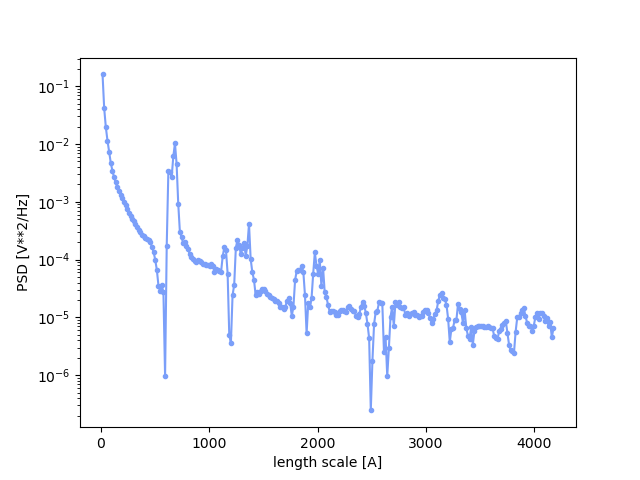

In [336]:
from scipy import signal
plt.figure()
fs = 1/((max(data.x) - min(data.x)) / len(data.x))
f, Pxx_den = signal.periodogram(np.log10(data.y), fs)
plt.semilogy(f[1:]*2*np.pi, Pxx_den[1:],'.-')
#plt.ylim([1e-9, 1e0])
plt.xlabel('length scale [A]')
plt.ylabel('PSD [V**2/Hz]')
plt.show()



In [330]:
1/(data.x[2]-data.x[1])

1327.1775756373231

In [333]:
1/0.009

111.11111111111111